# **SC1015 Project - Video Game Sales an Ratings**

Manikandan Yuvana \(U2322251E\) 


Rajadharshini Nedumaran \(U2322490L\)

Kalaiselvan Shanmugapriyan \(U2323515D\)


**Context + Abstract**

- Data from Kaggle and describes global video games sales and ratings from 1980 to 2016 \([https://www.kaggle.com/datasets/thedevastator/video\-game\-sales\-and\-ratings](https://www.kaggle.com/datasets/thedevastator/video-game-sales-and-ratings)\)

- Why Video Games? Video games are not only a form of entertainment but also a significant cultural and economic phenomenon. They have evolved from simple leisure activities into complex narratives and virtual experiences that engage millions of people globally, influencing popular culture, technology, and media consumption. The study of video games through datasets, like the Video Games Sales and Ratings Dataset, offers crucial insights into consumer preference and market dynamics.

- As avid video game players, we are interested in learning how machine learning can help us predict the global sale price of each type of video game

**Description of Data Set**

1. **Name:** This attribute refers to the name of each video game included in the dataset
2. **Platform**: This denotes the platform\(s\) on which a particular game operates
3. **Year\_of\_Release**: The year when a particular game was launched is depicted by this attribute.
4. **Genre:** It indicates the type of genre the video game corresponds to.
5. **Publisher & Developer:** These fields detail out which company has published and developed every game respectively.
6. **NA\_Sales, EU\_Sales, JP\_Sales & Other\_Sales:** These signify sales numbers from North America \(NA\), Europe\(EU\), Japan\(JP\) regions as well as other parts of world respectively \(measured in millions\).
7. **Global\_Sales:** This category refers to overall international sales for each described gaming product.
8. **Critic\_Score & User\_score**: It represents average scores attributed by critics or users; where higher indicates better reception mostly measured on a scale often spanning 0–10 or 0–100.
9. **Critic\_Count & User\_Count:** They denote how many critics/users have rated particular games respectively.
10. **Rating**: ESRB's categorization for games \(e.g., E for Everyone,T for Teen,M for Mature etc.\) is portrayed through it.

**Motivation**

1. Sales Performance: You can examine sales figures categorized regionally or globally, leading to understanding which games have been most profitable and in which regions.

2. Genre or platform preference: With data about the genre and platform for each game you can understand what types of games are more popular on specific platforms or which genres seem to be fan favourites.

3. Objective is to predict the global sales from various game-related variables such as ratings, genre, platform and domestic sales to gain insights into consumer preferences and market dynamics.

4. Using data from 1980\-2009 to train linear models and using data from 2010 to 2016 to test the linear models and ML models.
5. The method for prediction are linear regression, Lasso regression and  Radial Basis Function. We will compare the accuracy of these models




## Importing Library and File


In [1]:
import numpy as np
import pandas as pd

import seaborn as sb
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
sb.set()
import seaborn as sns

In [2]:
main_data=pd.read_csv("Video_Games.csv")

In [3]:
#printing the first few lines of dataset
main_data.head()

,index,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Developer,Rating
0,0,Wii Sports,Wii,2006.0,Sports,Nintendo,41.36,28.96,3.77,8.45,82.53,76.0,51.0,8,322.0,Nintendo,E
1,1,Super Mario Bros.,NES,1985.0,Platform,Nintendo,29.08,3.58,6.81,0.77,40.24,NaN,NaN,NaN,NaN,NaN,NaN
2,2,Mario Kart Wii,Wii,2008.0,Racing,Nintendo,15.68,12.76,3.79,3.29,35.52,82.0,73.0,8.3,709.0,Nintendo,E
3,3,Wii Sports Resort,Wii,2009.0,Sports,Nintendo,15.61,10.93,3.28,2.95,32.77,80.0,73.0,8,192.0,Nintendo,E
4,4,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,Nintendo,11.27,8.89,10.22,1.00,31.37,NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
print("Data type : ",type(main_data))
print("Data dims: ",main_data.shape)

Data type :  <class 'pandas.core.frame.DataFrame'>
Data dims:  (16928, 17)


Our pre\-cleaned dataset contains 17 columns which are: 
Index, Name, Platform, Year\_of\_Release, Genre,Publisher, NA\_Sales, EU\_Sales, JP\_Sales, Other\_Sales, Global\_Sales, Critic\_Score, Critic\_Count, User\_Score, User\_Count, Developer, Rating

There was a total of 16928 rows. 



In [5]:
print(main_data.dtypes)

index                int64
Name                object
Platform            object
Year_of_Release    float64
Genre               object
Publisher           object
NA_Sales           float64
EU_Sales           float64
JP_Sales           float64
Other_Sales        float64
Global_Sales       float64
Critic_Score       float64
Critic_Count       float64
User_Score          object
User_Count         float64
Developer           object
Rating              object
dtype: object


There are 9 Numeric Columns which are: NA\_Sales, EU\_Sales,JP\_Sales, Other\_Sales, Global\_Sales, Critic\_Score, Critic\_Count, User\_Score, User\_Count 

There are 8 Categorical Columns which are: Index, Name, Platform, Year\_of\_Release,Genre,Publisher, Developer, Rating


## DATA CLEANING

1. Removing Null Values
2. Outliers
3. Target Encoding 

In [6]:
main_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16928 entries, 0 to 16927
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   index            16928 non-null  int64  
 1   Name             16926 non-null  object 
 2   Platform         16928 non-null  object 
 3   Year_of_Release  16655 non-null  float64
 4   Genre            16926 non-null  object 
 5   Publisher        16873 non-null  object 
 6   NA_Sales         16928 non-null  float64
 7   EU_Sales         16928 non-null  float64
 8   JP_Sales         16928 non-null  float64
 9   Other_Sales      16928 non-null  float64
 10  Global_Sales     16928 non-null  float64
 11  Critic_Score     8260 non-null   float64
 12  Critic_Count     8260 non-null   float64
 13  User_Score       10159 non-null  object 
 14  User_Count       7718 non-null   float64
 15  Developer        10240 non-null  object 
 16  Rating           10092 non-null  object 
dtypes: float64(9

There are 16928 rows, in total but for columns like Name,Genre, Publisher,Critic_Score, Critic_Count, User_Score, User_Count, Developer, Rating and so on have lesser than 16928 non-null values, indicating presence of null values. Hence, we will be removing colums with null values.

### Removing Null Values

In [7]:
main_data=main_data.dropna()

In [8]:
main_data.isnull().sum()

index              0
Name               0
Platform           0
Year_of_Release    0
Genre              0
Publisher          0
NA_Sales           0
EU_Sales           0
JP_Sales           0
Other_Sales        0
Global_Sales       0
Critic_Score       0
Critic_Count       0
User_Score         0
User_Count         0
Developer          0
Rating             0
dtype: int64

In [9]:
print("Data type : ",type(main_data))
print("Data dims: ",main_data.shape)

Data type :  <class 'pandas.core.frame.DataFrame'>
Data dims:  (6938, 17)


In [10]:
main_data['User_Score'] = main_data['User_Score'].astype(object).astype(float)

After nulls values are removed, we have 17 columns and 6938 rows of data. The User_Score, though a numeric data has been recorded as an object, hence we converted the values to a float.

In [11]:
main_data.head()

,index,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Developer,Rating
0,0,Wii Sports,Wii,2006.0,Sports,Nintendo,41.36,28.96,3.77,8.45,82.53,76.0,51.0,8.0,322.0,Nintendo,E
2,2,Mario Kart Wii,Wii,2008.0,Racing,Nintendo,15.68,12.76,3.79,3.29,35.52,82.0,73.0,8.3,709.0,Nintendo,E
3,3,Wii Sports Resort,Wii,2009.0,Sports,Nintendo,15.61,10.93,3.28,2.95,32.77,80.0,73.0,8.0,192.0,Nintendo,E
6,6,New Super Mario Bros.,DS,2006.0,Platform,Nintendo,11.28,9.14,6.50,2.88,29.80,89.0,65.0,8.5,431.0,Nintendo,E
7,7,Wii Play,Wii,2006.0,Misc,Nintendo,13.96,9.18,2.93,2.84,28.92,58.0,41.0,6.6,129.0,Nintendo,E


In [12]:
main_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6938 entries, 0 to 16926
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   index            6938 non-null   int64  
 1   Name             6938 non-null   object 
 2   Platform         6938 non-null   object 
 3   Year_of_Release  6938 non-null   float64
 4   Genre            6938 non-null   object 
 5   Publisher        6938 non-null   object 
 6   NA_Sales         6938 non-null   float64
 7   EU_Sales         6938 non-null   float64
 8   JP_Sales         6938 non-null   float64
 9   Other_Sales      6938 non-null   float64
 10  Global_Sales     6938 non-null   float64
 11  Critic_Score     6938 non-null   float64
 12  Critic_Count     6938 non-null   float64
 13  User_Score       6938 non-null   float64
 14  User_Count       6938 non-null   float64
 15  Developer        6938 non-null   object 
 16  Rating           6938 non-null   object 
dtypes: float64(10), in

Here, we have an overview of the cleaned data, we currently have 6938 rows with Numeric Columns as intergers and float types and Categorical Columns as object types. 

### Outliers

<span style='font-size:small'>The code below, prints out the number of outliers per column.</span>  It only removes outliers from Numeric Column excluding Global\_Sales as we are using it as a predictor. The number of outliers per column is found by first computing the lower and upper quartile ranges and the interquartile range, r.  Then outliers are found using the IQR method. An outlier is defined as a value that is either:

Below q1 \- 1.5 \* r \(lower fence\)

Above q3 \+ 1.5 \* r \(upper fence\)

The total sum of outliers per column is then printed. 



In [13]:
for column in main_data.columns:
    if column != 'Name' and column != 'Year_of_Release' and column != 'Global_Sales':
        # Check if the column contains numeric data
        if pd.api.types.is_numeric_dtype(main_data[column]):
            q1 = main_data[column].quantile(0.25)
            q3 = main_data[column].quantile(0.75)
            r = q3 - q1
            print("Number of outliers of", column, ":")
            print(((main_data[column] < (q1 - 1.5 * r)) | (main_data[column] > (q3 + 1.5 * r))).sum())
            print() 

Number of outliers of index :
0

Number of outliers of NA_Sales :
686

Number of outliers of EU_Sales :
771

Number of outliers of JP_Sales :
1516

Number of outliers of Other_Sales :
799

Number of outliers of Critic_Score :
100

Number of outliers of Critic_Count :
176

Number of outliers of User_Score :
268

Number of outliers of User_Count :
1006



It is found by that the JP\_Sales \(Japan Sales\) and User\_Counts have excessive outliers hence, these columns have been dropped from the dataset to improve accuracy of prediction.



In [14]:
main_data=main_data.drop(columns=['JP_Sales','User_Count'])

The outliers functions detects the number of outliers with the IQR formula. The remove function removes rows from the DataFrame based on the list of indices.

The while loop uses these functions and removes the outliers from numeric columns.

In [15]:
def outliers(df, ft):
    Q1 = df[ft].quantile(0.25)
    Q3 = df[ft].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    ls = df.index[(df[ft] < lower_bound) | (df[ft] > upper_bound)]
    return ls

def remove(df, ls):
    ls = sorted(set(ls))
    df = df.drop(ls)
    return df

# Iteratively remove outliers until none are left in any column
while True:
    index_list = []
    for column in main_data.columns:
        if main_data[column].dtype != object and column != 'Name' and column != 'index' and column != 'Year_of_Release':
            index_list.extend(outliers(main_data, column))
    if len(index_list) == 0:
        break
    main_data = remove(main_data, index_list)

print("Outliers removed successfully.")

Outliers removed successfully.


In [16]:
main_data.shape

(3186, 15)

In [17]:
for column in main_data.columns:
    if column != 'Name' and column != 'Year_of_Release' and column != 'Global_Sales':
        # Check if the column contains numeric data
        if pd.api.types.is_numeric_dtype(main_data[column]):
            Q1=main_data[column].quantile(0.25)
            Q3=main_data[column].quantile(0.75)
            IQR=Q3-Q1
            lower_bound=Q1-1.5*IQR
            upper_bound=Q3+1.5*IQR
            print("Number of outliers of", column, ":")
            print(((main_data[column] < (lower_bound)) | (main_data[column] > (upper_bound))).sum())
            print()  # Add a newline for better formatting

Number of outliers of index :
0

Number of outliers of NA_Sales :
0

Number of outliers of EU_Sales :
0

Number of outliers of Other_Sales :
0

Number of outliers of Critic_Score :
0

Number of outliers of Critic_Count :
0

Number of outliers of User_Score :
0



After removing outliers, we have 15 columns with 7 Numeric Columns and 8 Categorical Columns. There is a total of 3186 rows of data. The data set is cleaned!


<span style='font-size:large'>**Target Encoding**</span>

<span style='font-size:small'>Since we will be using regression models, we would need numeric inputs, however, we have Categorical Columns hence we used target encoding a method for handling categorical variables by replacing them with a number that represents the mean target value for each category in this case the mean global sale for each category. We did target encoding for Platform, Genre, Publisher, Developer, Rating </span>



In [18]:
for column in main_data.columns:
    if main_data[column].dtype == object and column != 'Name' and column != 'index':
        mean_column = main_data.groupby(column)['Global_Sales'].mean()  #This line groups the DataFrame by the current column and calculates the mean of 'Global_Sales'for each column
        main_data[f'mean_{column}'] = main_data[column].map(mean_column) #This line creates a new column in DataFrame and maps each category in the original column to its corresponding mean sales value

In [19]:
for column in main_data.columns:
    if main_data[column].dtype == object and column != 'Name' and column != 'index':
        mean_column = main_data.groupby(column)['Global_Sales'].mean()
        print(f"Mean of {column}: {mean_column}") #This line printes the mean sales for each category
        print()
        print()

Mean of Platform: Platform
3DS     0.167342
DC      0.160000
DS      0.136520
GBA     0.134574
GC      0.141435
PC      0.052138
PS      0.143061
PS2     0.152714
PS3     0.180270
PS4     0.094271
PSP     0.129953
PSV     0.144886
Wii     0.160289
WiiU    0.134103
X360    0.166431
XB      0.137429
XOne    0.119016
Name: Global_Sales, dtype: float64


Mean of Genre: Genre
Action          0.141645
Adventure       0.111928
Fighting        0.162034
Misc            0.160000
Platform        0.134270
Puzzle          0.100429
Racing          0.122934
Role-Playing    0.144383
Shooter         0.117278
Simulation      0.118077
Sports          0.151167
Strategy        0.090684
Name: Global_Sales, dtype: float64


Mean of Publisher: Publisher
10TACLE Studios           0.020000
1C Company                0.030000
2D Boy                    0.040000
3DO                       0.138000
505 Games                 0.099318
                            ...   
Zoo Digital Publishing    0.116667
Zoo Games      

In [20]:
main_data.head()

,index,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,Developer,Rating,mean_Platform,mean_Genre,mean_Publisher,mean_Developer,mean_Rating
4653,4653,Animal Crossing: Amiibo Festival,WiiU,2015.0,Misc,Nintendo,0.19,0.11,0.03,0.41,46.0,20.0,4.4,"Nintendo, Nd Cube",E,0.134103,0.160000,0.207843,0.410000,0.136599
4720,4720,Armored Core 2: Another Age,PS2,2001.0,Simulation,Metro 3D,0.11,0.08,0.03,0.41,75.0,16.0,8.8,From Software,T,0.152714,0.118077,0.180000,0.162759,0.136858
4751,4751,BlazBlue: Continuum Shift,PS3,2010.0,Fighting,PQube,0.21,0.07,0.04,0.41,87.0,29.0,8.0,Arc System Works,T,0.180270,0.162034,0.130000,0.145357,0.136858
4788,4788,Battalion Wars,GC,2005.0,Strategy,Nintendo,0.25,0.07,0.01,0.40,76.0,43.0,8.8,Kuju Entertainment,T,0.141435,0.090684,0.207843,0.176667,0.136858
4813,4813,Ragnarok Odyssey,PSV,2012.0,Role-Playing,GungHo,0.20,0.01,0.03,0.40,66.0,21.0,7.8,Game Arts,T,0.144886,0.144383,0.176667,0.252857,0.136858


From the above column we can see that the categorical object inputs have become a numeric input, which are the mean of Global_Sales for each category. This is done for  mean\_Platform, mean\_Genre,mean\_Publisher, mean\_Developer and mean\_Rating.


In [21]:
main_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3186 entries, 4653 to 16753
Data columns (total 20 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   index            3186 non-null   int64  
 1   Name             3186 non-null   object 
 2   Platform         3186 non-null   object 
 3   Year_of_Release  3186 non-null   float64
 4   Genre            3186 non-null   object 
 5   Publisher        3186 non-null   object 
 6   NA_Sales         3186 non-null   float64
 7   EU_Sales         3186 non-null   float64
 8   Other_Sales      3186 non-null   float64
 9   Global_Sales     3186 non-null   float64
 10  Critic_Score     3186 non-null   float64
 11  Critic_Count     3186 non-null   float64
 12  User_Score       3186 non-null   float64
 13  Developer        3186 non-null   object 
 14  Rating           3186 non-null   object 
 15  mean_Platform    3186 non-null   float64
 16  mean_Genre       3186 non-null   float64
 17  mean_Publisher 

## Exploratory Data Analysis

1. Univariate (Numeric) 
2. Univariate (Categorical) 
3. Multivariate

### Univariate (Numeric)

We did Univariate Statistics for Numeric and Categorical data individually. For Numeric data, we did boxplots and histograms, helping us visualise and understand the distribution and characterisitc of the numeric data



In [22]:
main_data[['NA_Sales','EU_Sales','Other_Sales','Global_Sales','Critic_Score','Critic_Count','User_Score']].describe()

,NA_Sales,EU_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score
count,3186.000000,3186.000000,3186.000000,3186.000000,3186.000000,3186.000000,3186.000000
mean,0.078368,0.031014,0.010374,0.134002,67.817012,22.311676,7.289831
std,0.063367,0.029342,0.010068,0.089675,11.859384,12.712267,1.158193
min,0.000000,0.000000,0.000000,0.010000,37.000000,3.000000,4.200000
25%,0.030000,0.010000,0.000000,0.060000,60.000000,12.000000,6.500000
50%,0.070000,0.020000,0.010000,0.120000,69.000000,20.000000,7.500000
75%,0.120000,0.050000,0.020000,0.200000,77.000000,31.000000,8.200000
max,0.250000,0.110000,0.050000,0.410000,98.000000,59.000000,9.600000


#### Boxplot 

<span style='font-size:small'>This shows the median and quartiles as well as the symmetry and spread of data. From the below box\-plots, we can see that the spread of data are similar for NA\_Sales, EU\_Sales, Other\_Sales and Global\_Sales, with Global\_Sales with highest mean, followed by NA\_Sales, EU\_Sales and Other\_Sales. </span>


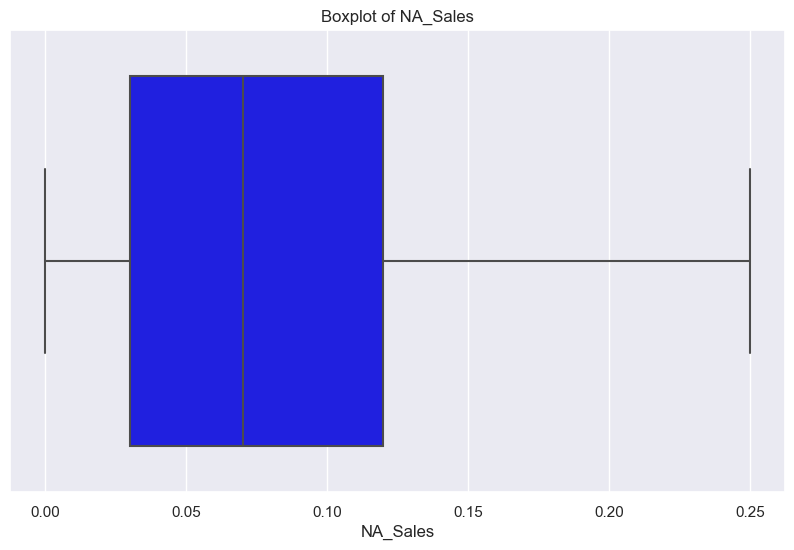

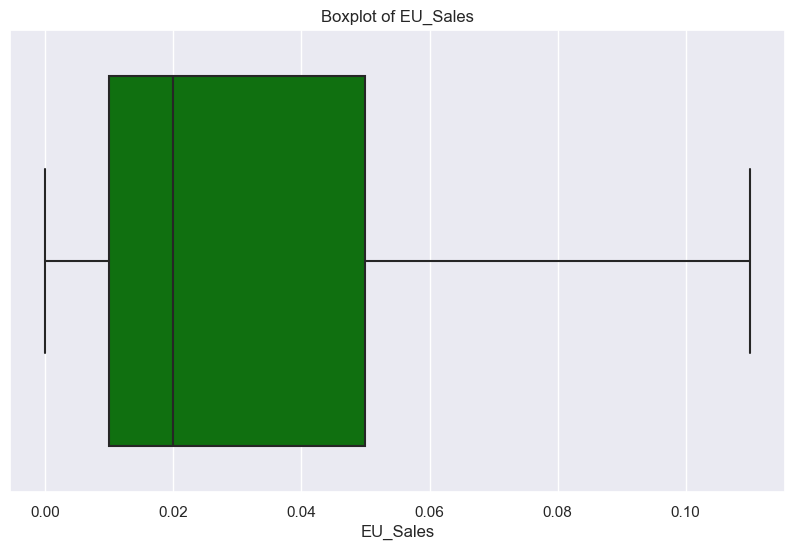

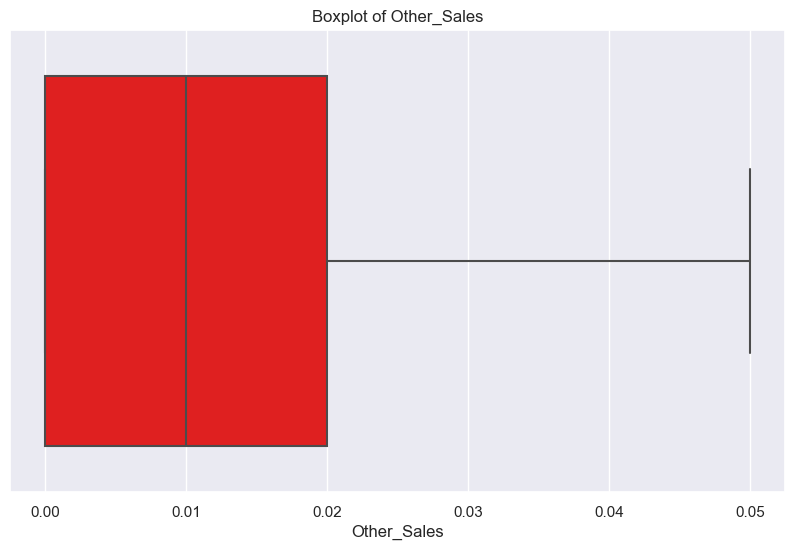

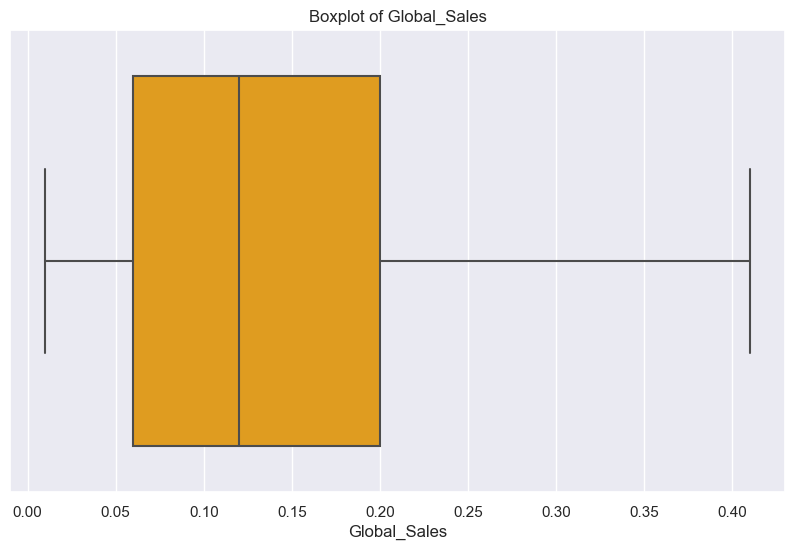

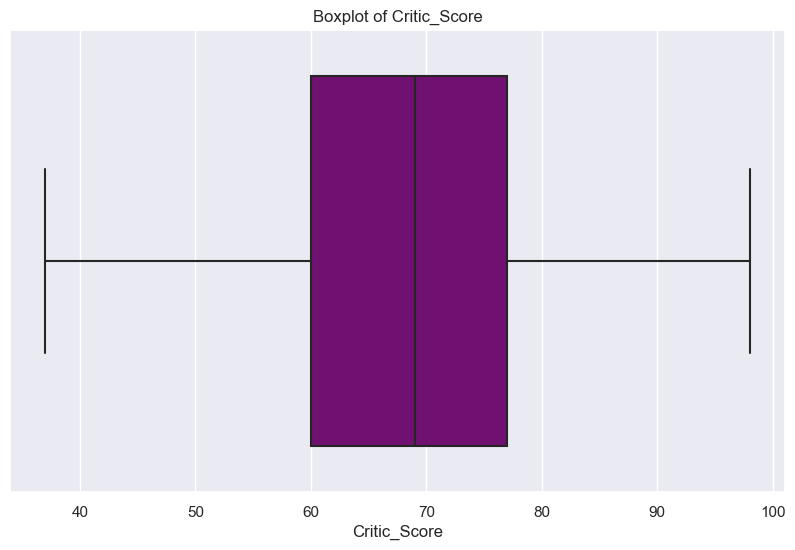

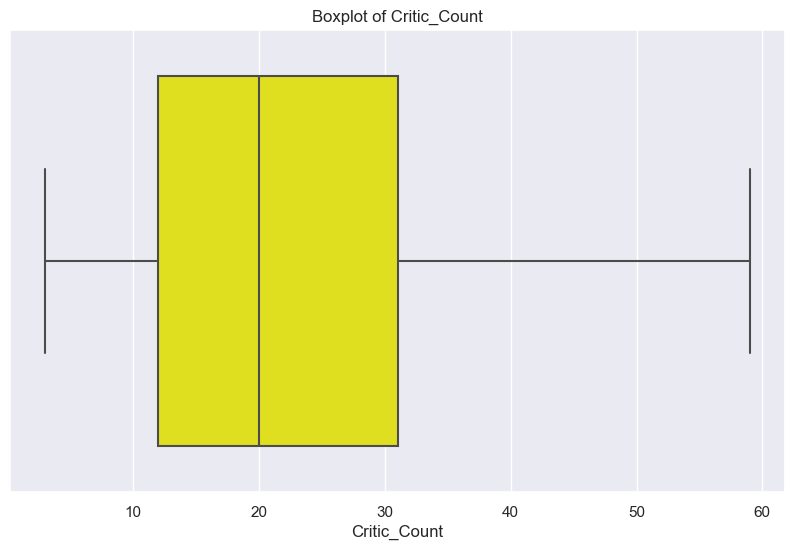

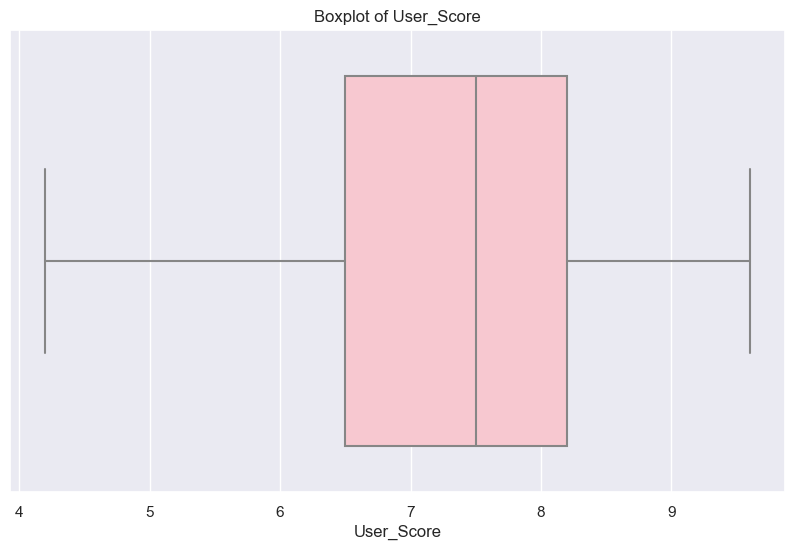

In [23]:
columns = ['NA_Sales', 'EU_Sales', 'Other_Sales', 'Global_Sales', 'Critic_Score', 'Critic_Count', 'User_Score']

colors = ['blue', 'green', 'red', 'orange', 'purple', 'yellow', 'pink']

# Iterate through each column and plot a boxplot with a different color
for i, column in enumerate(columns):
    plt.figure(figsize=(10, 6))
    sns.boxplot(x=main_data[column], orient='h', color=colors[i % len(colors)])  # Pass the color based on index
    plt.title(f'Boxplot of {column}')
    plt.show()

#### Histogram

<span style='font-size:small'>We can use histograms to study the distribution shape, central tendency and spread of data, but most importantly the frequency of data. From the histograms we can analyze that a Critic\_Score of 72 and User\_Socre of about 7.8 have the highest frequency. For NA\_Sales, EU\_Sales and Other\_Sales, the highest frequency is about 0.01 million and for Global\_Sales about 0.03 million</span>



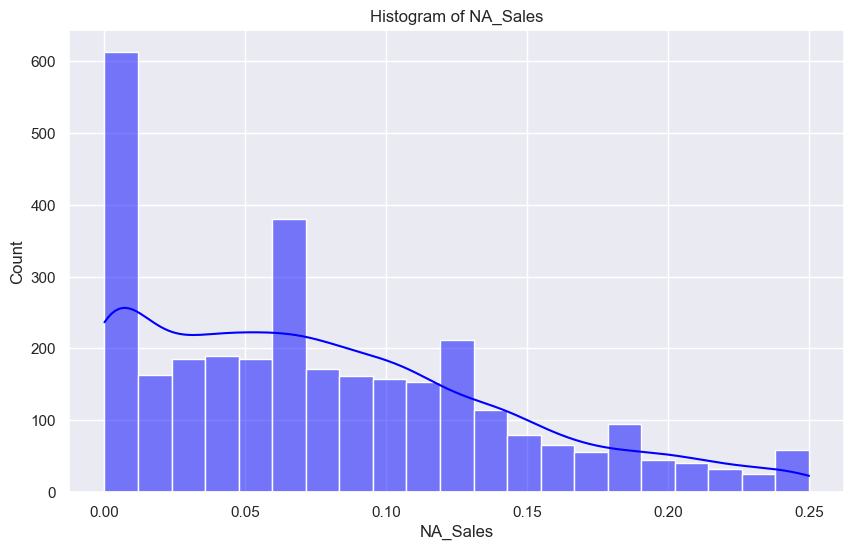

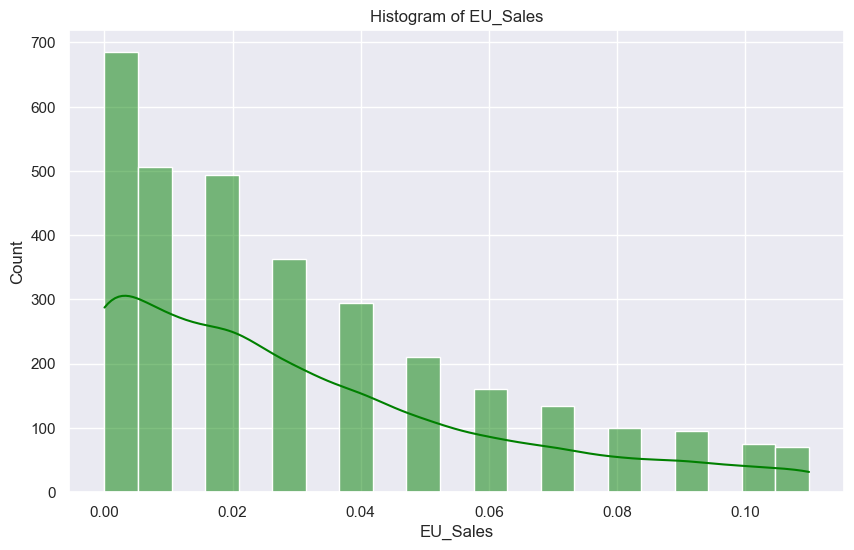

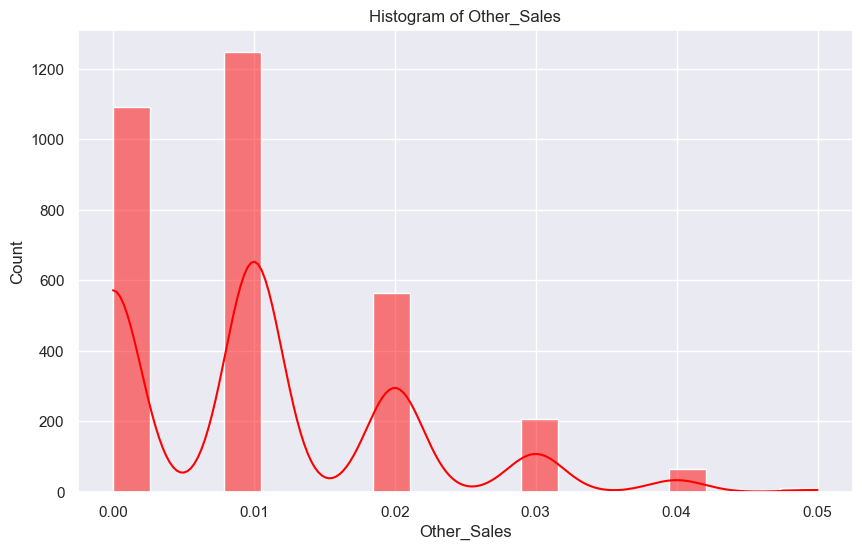

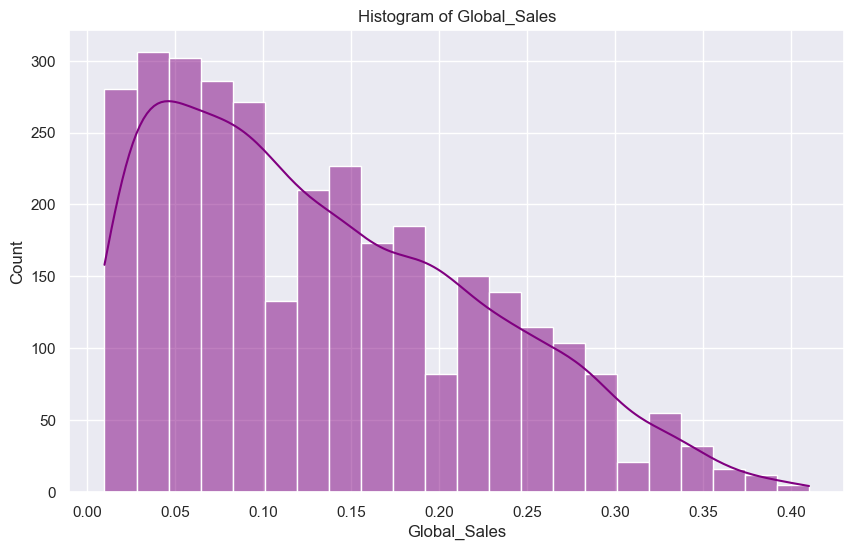

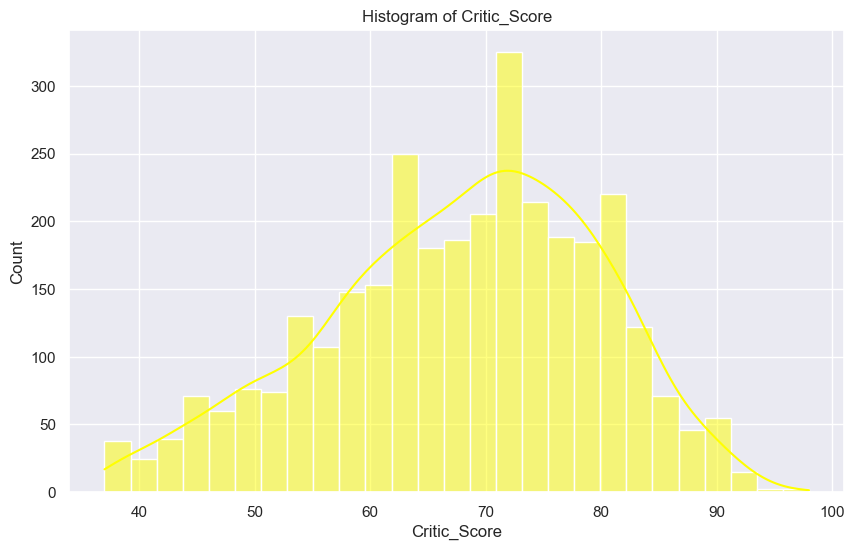

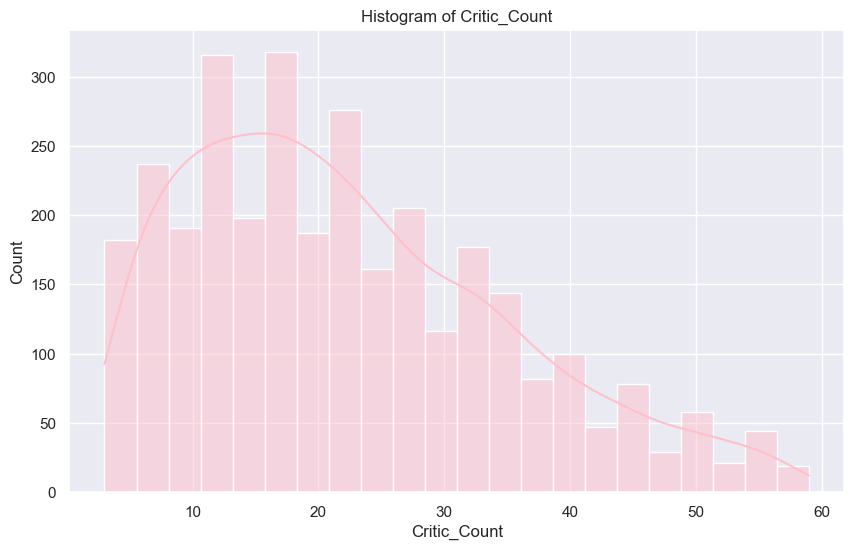

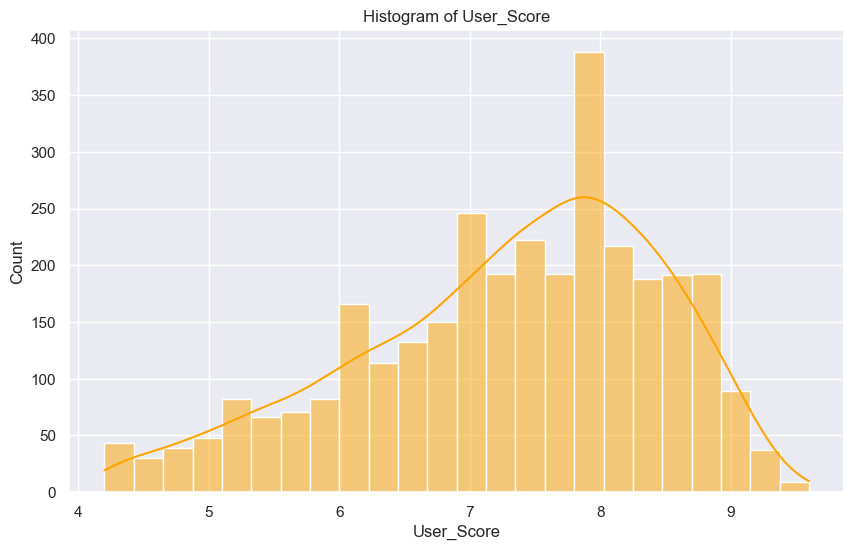

In [24]:
# List of colors for histograms
colors = ['blue', 'green', 'red', 'purple', 'yellow', 'pink', 'orange']

# Assuming 'columns' contains the column names
for idx, column in enumerate(columns):
    plt.figure(figsize=(10, 6))
    sns.histplot(data=main_data[column], kde=True, color=colors[idx % len(colors)])  # Use modulo to loop through colors
    plt.title(f'Histogram of {column}')
    plt.show()

### Categorical Data

### <span style='font-size:small'>For categorical data, we began with statistical description followed by a count plot and histogram.</span>

<span style='font-size:small'>The categorical data we used for analysis were: Platform, Genre, Publisher, Developer, Rating, Year\_of\_Release, mean\_Platform mean\_Genre, mean\_Publisher, mean\_Developer, mean\_Rating. </span>

<span style='font-size:small'>Since Year\_of\_Release had too many categories, we grouped the catergories according to: 1985\-1999, 2000\-2009, 2010\-2016, Post\-2016. This was useful in the future where we split our train and test data according to year, and trained using data from 1985\-1999 and 2000\-2009 and tested using data from 2010\-2016.</span>



In [25]:
# Define bins and labels for the categorization
bins = [1984, 1999, 2009, 2016, float('inf')]
labels = ['1985-1999', '2000-2009', '2010-2016', 'Post-2016']

# Categorize years using cut
main_data['Year_of_Release'] = pd.cut(main_data['Year_of_Release'], bins=bins, labels=labels, right=True)

# Check the result
main_data.head()

,index,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,Developer,Rating,mean_Platform,mean_Genre,mean_Publisher,mean_Developer,mean_Rating
4653,4653,Animal Crossing: Amiibo Festival,WiiU,2010-2016,Misc,Nintendo,0.19,0.11,0.03,0.41,46.0,20.0,4.4,"Nintendo, Nd Cube",E,0.134103,0.160000,0.207843,0.410000,0.136599
4720,4720,Armored Core 2: Another Age,PS2,2000-2009,Simulation,Metro 3D,0.11,0.08,0.03,0.41,75.0,16.0,8.8,From Software,T,0.152714,0.118077,0.180000,0.162759,0.136858
4751,4751,BlazBlue: Continuum Shift,PS3,2010-2016,Fighting,PQube,0.21,0.07,0.04,0.41,87.0,29.0,8.0,Arc System Works,T,0.180270,0.162034,0.130000,0.145357,0.136858
4788,4788,Battalion Wars,GC,2000-2009,Strategy,Nintendo,0.25,0.07,0.01,0.40,76.0,43.0,8.8,Kuju Entertainment,T,0.141435,0.090684,0.207843,0.176667,0.136858
4813,4813,Ragnarok Odyssey,PSV,2010-2016,Role-Playing,GungHo,0.20,0.01,0.03,0.40,66.0,21.0,7.8,Game Arts,T,0.144886,0.144383,0.176667,0.252857,0.136858


In [26]:
counts = main_data.groupby('Year_of_Release').size()
print(counts)

Year_of_Release
1985-1999      26
2000-2009    2277
2010-2016     883
Post-2016       0
dtype: int64


#### Statistical Description


In [27]:
# Categorical Predictors
main_data[['Platform','Genre','Publisher','Developer','Rating','Year_of_Release','mean_Platform','mean_Genre','mean_Publisher','mean_Developer','mean_Rating']].describe()

,mean_Platform,mean_Genre,mean_Publisher,mean_Developer,mean_Rating
count,3186.000000,3186.000000,3186.000000,3186.000000,3186.000000
mean,0.134002,0.134002,0.134002,0.134002,0.134002
std,0.036683,0.018688,0.033312,0.056829,0.004358
min,0.052138,0.090684,0.010000,0.010000,0.030000
25%,0.129953,0.118077,0.116907,0.095385,0.128467
50%,0.141435,0.141645,0.142500,0.137193,0.136599
75%,0.152714,0.144383,0.153609,0.167500,0.136858
max,0.180270,0.162034,0.340000,0.410000,0.136858


In [28]:
columns=['Platform','Genre','Publisher','Developer','Rating','Year_of_Release','mean_Platform','mean_Genre','mean_Publisher','mean_Developer','mean_Rating']

#### Histogram

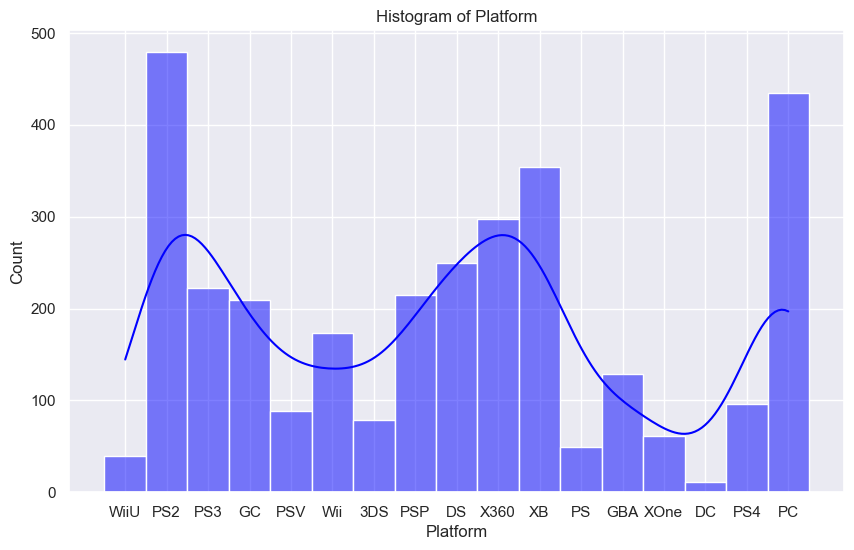

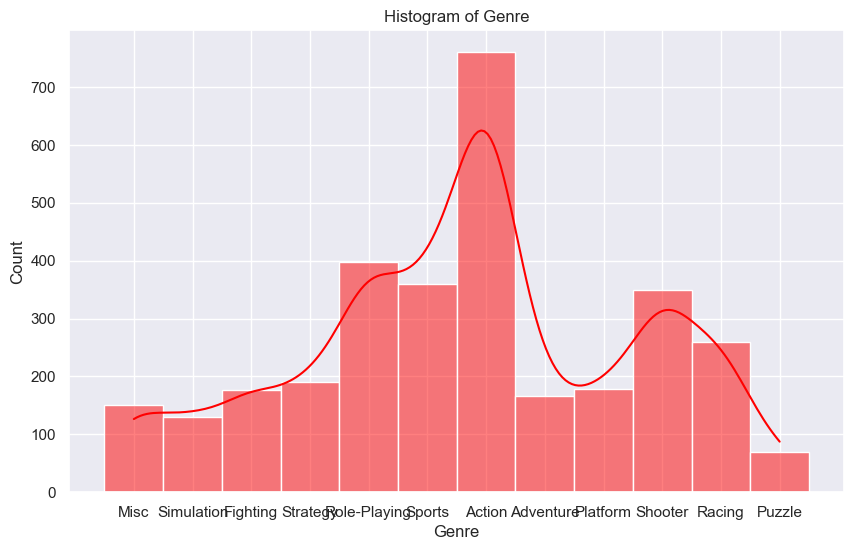

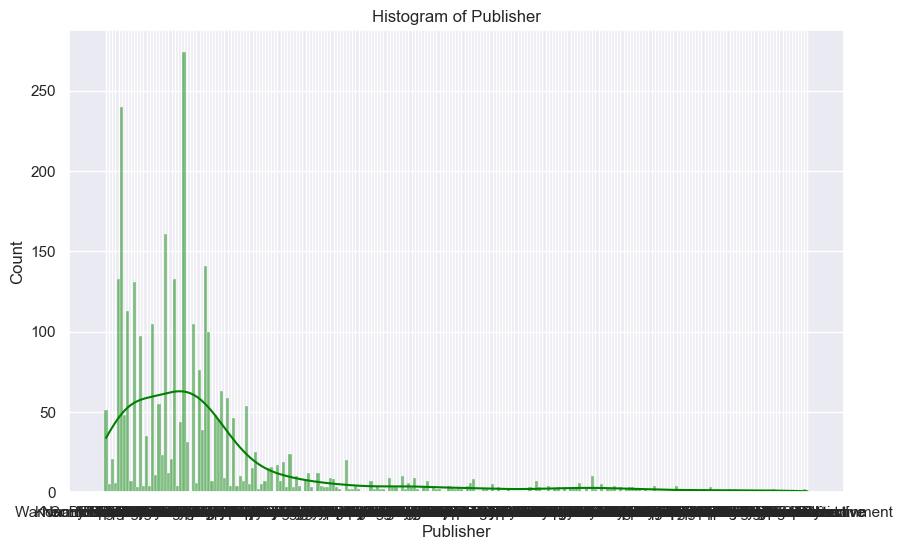

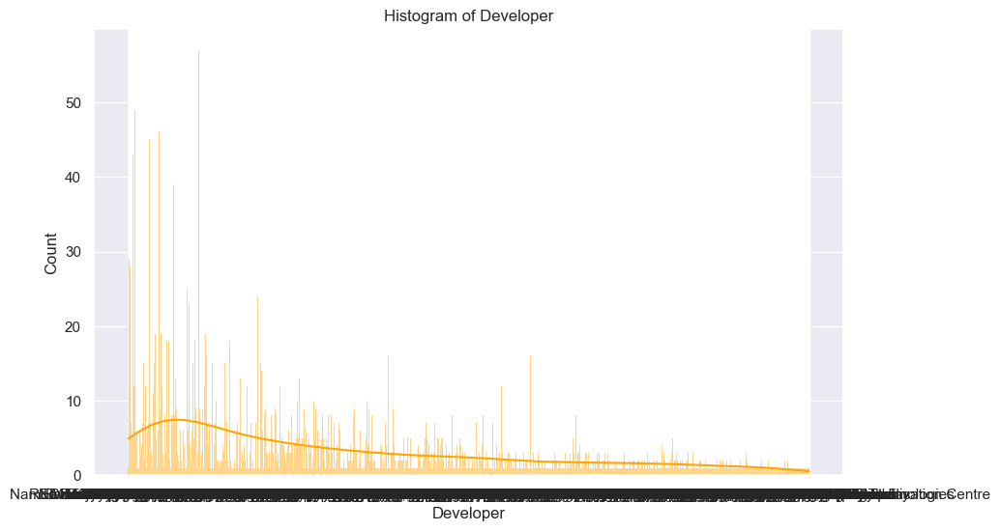

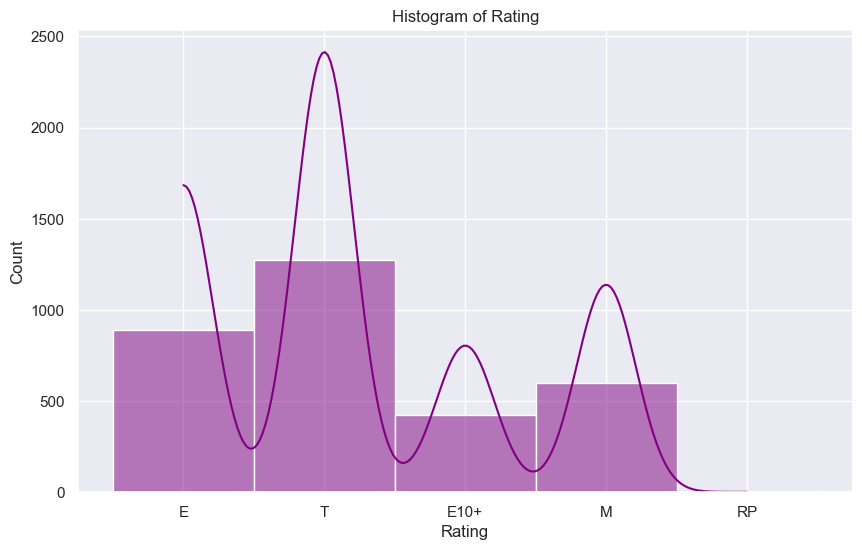

...

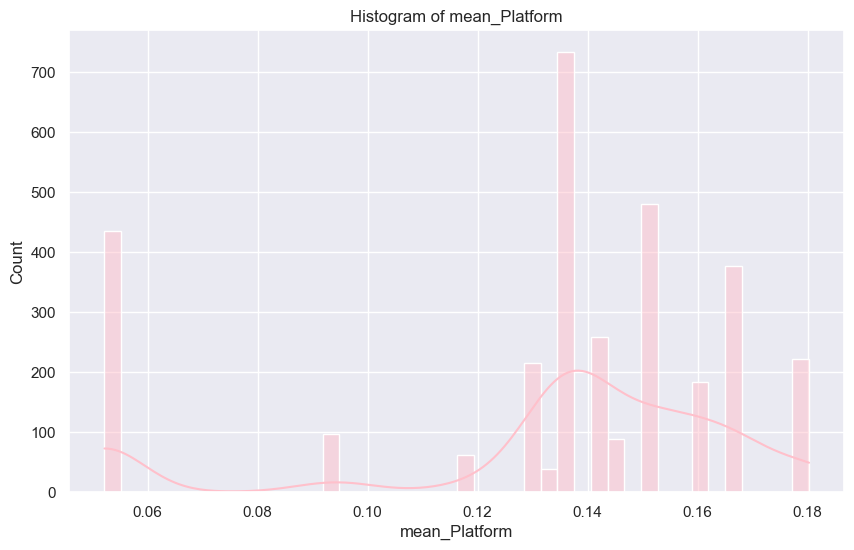

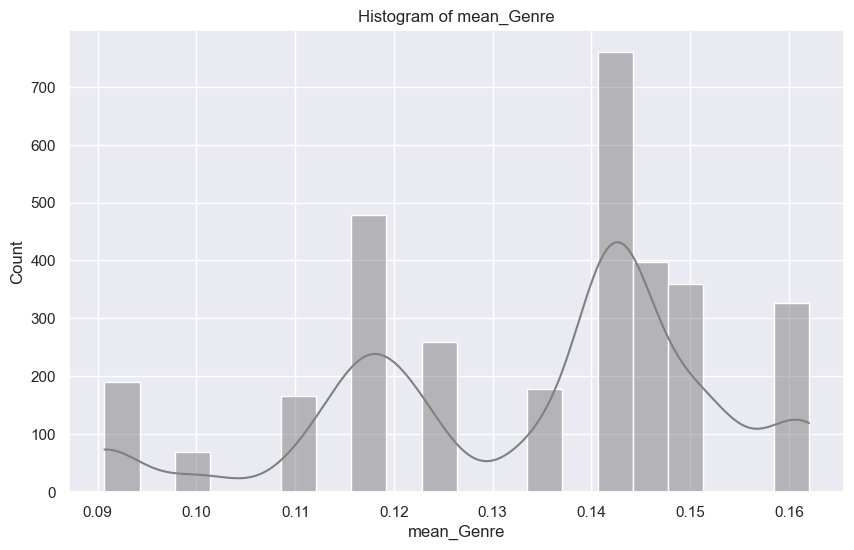

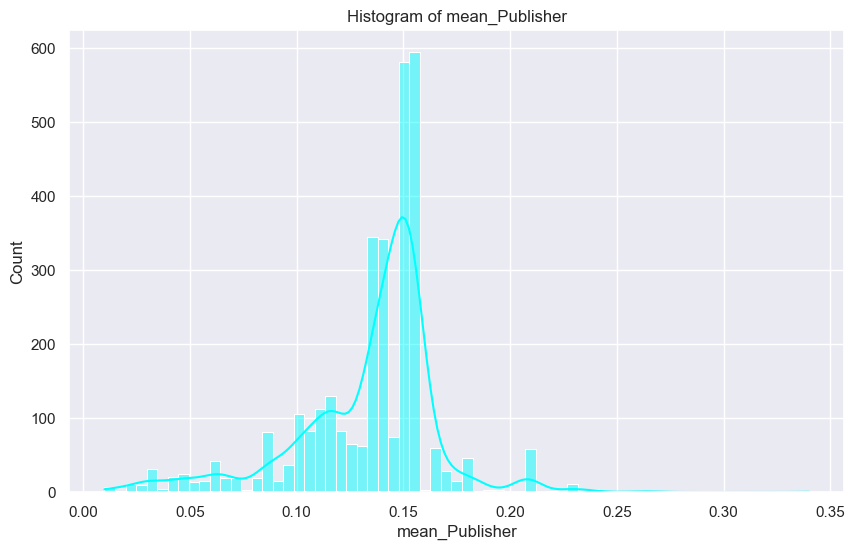

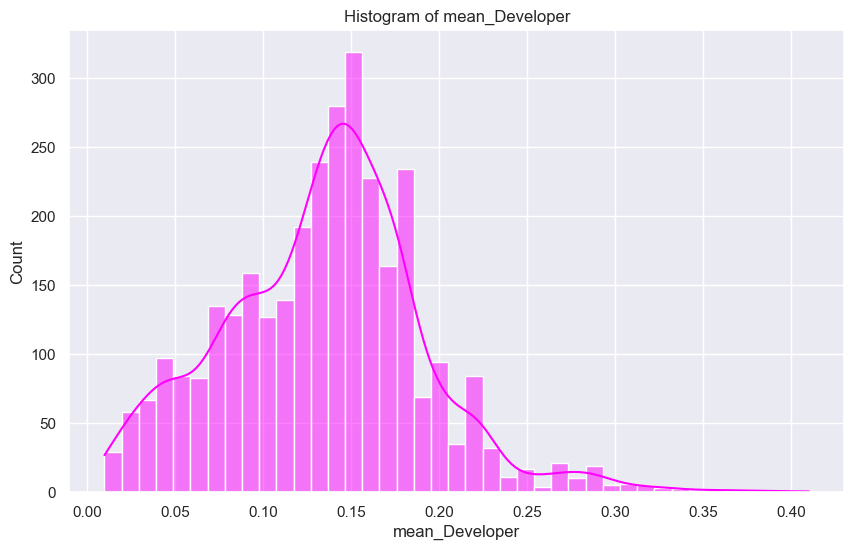

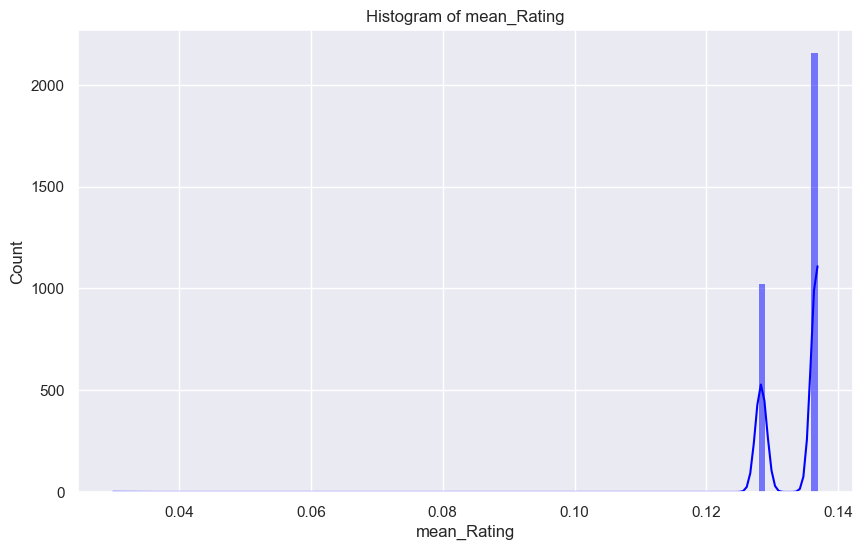

In [29]:
colors = ['blue', 'red', 'green', 'orange', 'purple', 'brown', 'pink', 'gray', 'cyan', 'magenta']

# Iterate through each column and plot a histogram with a different color
for i, column in enumerate(columns):
    plt.figure(figsize=(10, 6))
    sb.histplot(data=main_data[column], kde=True, color=colors[i % len(colors)])  # Use modulus operator to cycle through colors
    plt.title(f'Histogram of {column}')
    plt.show()

### Multivariate Statistics

Multivariate Statistics is used to anlayse all the variables simultaneously to uncover relationships and patterns especially with our predictor Global_Sales

<span style='font-size:x-large'>Correlation Matrix</span>

<span style='font-size:small'>

#### Correlaion Matrix

A correlation matrix is used to quantify and display the degree of correlation between multiple variables within a dataset. From the correlation matrix we can see that the columns with high correlation with Global_Sales are NA_Sales (0.82), Other_Sales (0.70), EU_Sales (0.55) and mean_Developer (0.63)

                NA_Sales  EU_Sales  Other_Sales  Global_Sales  Critic_Score  \
NA_Sales        1.000000  0.275103     0.497264      0.821596     -0.045114   
EU_Sales        0.275103  1.000000     0.633730      0.549157      0.092068   
Other_Sales     0.497264  0.633730     1.000000      0.695694     -0.040501   
Global_Sales    0.821596  0.549157     0.695694      1.000000      0.029769   
Critic_Score   -0.045114  0.092068    -0.040501      0.029769      1.000000   
Critic_Count    0.110923  0.133559     0.172771      0.163542      0.218951   
User_Score     -0.043760  0.020093    -0.073019      0.015625      0.503341   
mean_Platform   0.432291  0.015767     0.284845      0.409069     -0.287944   
mean_Genre      0.193957  0.020762     0.113897      0.208399     -0.042132   
mean_Publisher  0.317859  0.136707     0.217147      0.371479      0.045710   
mean_Developer  0.540592  0.277182     0.402663      0.633720     -0.000600   
mean_Rating     0.045222 -0.013308    -0.035908     

<Axes: >

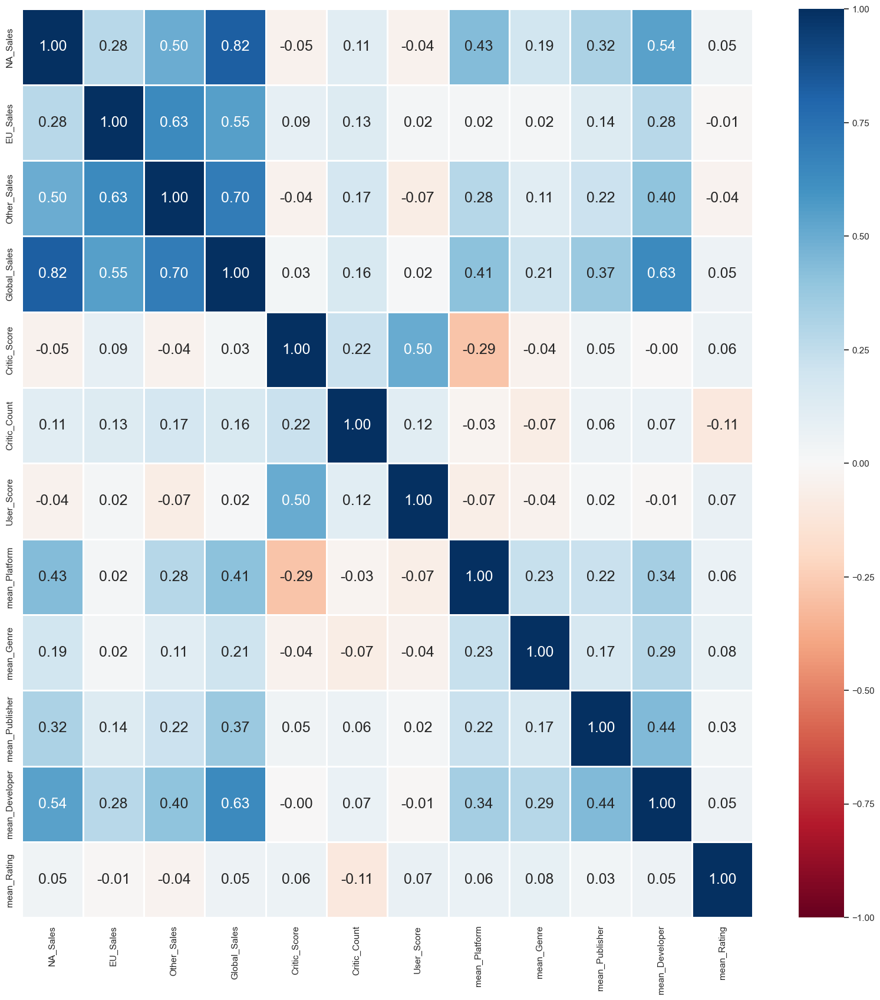

In [30]:
# Correlation Matrix
new_data=main_data[['NA_Sales','EU_Sales','Other_Sales','Global_Sales','Critic_Score','Critic_Count','User_Score','mean_Platform','mean_Genre','mean_Publisher','mean_Developer','mean_Rating']]
print(new_data.corr())

# Heatmap of the Correlation Matrix
f = plt.figure(figsize=(20, 20))
sb.heatmap(new_data.corr(), vmin = -1, vmax = 1, linewidths = 1,
           annot = True, fmt = ".2f", annot_kws = {"size": 18}, cmap = "RdBu")

#### Pair-plot 

D:\Anaconda\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


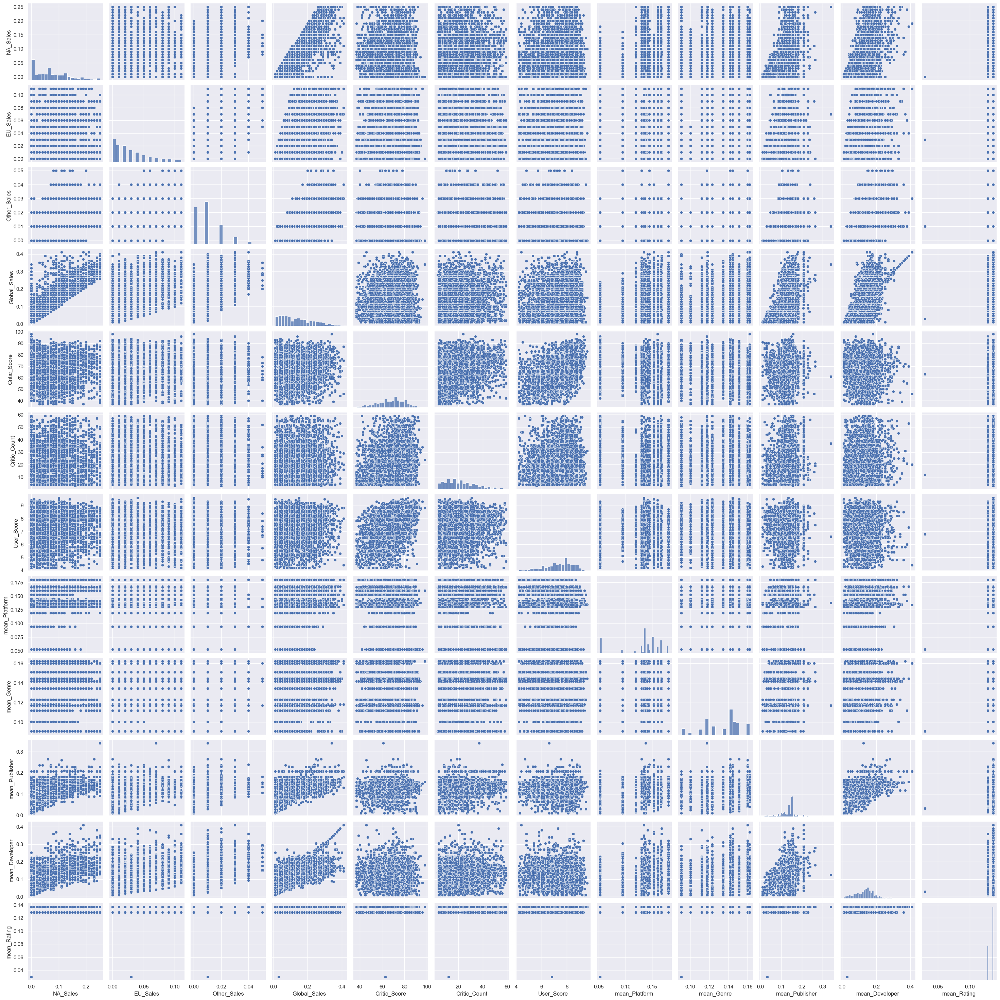

In [31]:
sb.pairplot(data = new_data)

## Data Preparation (Splitting Train and Test data)

We split the train and test data yearwise. Data from 1985 to 2009 is used for training and data from 2010 to 2016 is used for testing. Training on earlier data and testing on later data allows the model to capture and adapt to long-term trends, seasonal variations, and shifts in patterns over time, and models can be used for time-series forecasting.

In [32]:
train_data = pd.DataFrame(columns=main_data.columns)
test_data = pd.DataFrame(columns=main_data.columns)

In [33]:
for index,row in main_data.iterrows():
    if (row['Year_of_Release']=='1985-1999' or row['Year_of_Release']=='2000-2009'):
        train_data = pd.concat([train_data, pd.DataFrame(row).T],ignore_index=True)
    else:
        test_data = pd.concat([test_data, pd.DataFrame(row).T],ignore_index=True)

In [34]:
print("Shape of train_data:", train_data.shape)
print("Shape of test_data:", test_data.shape)

Shape of train_data: (2303, 20)
Shape of test_data: (883, 20)


## Linear Regression



Linear regression is a statistical method used for modeling the relationship between a dependent variable (target) and one or more independent variables (predictors). The basic premise of linear regression is to fit a linear equation to the observed data points to best explain the relationship between the variables.

Mathematically, linear regression models the relationship between the independent variables, X and the dependent variable, y as a linear combination of the independent variables:

y_i = β _0 + β_1X _i + ϵ_i

Where:

* y_i is the dependent variable
* X_i is the independent variable
* β _0 and β _1 are the coefficients of the independent variables, representing the effect of each independent variable on the dependent variable.
* ϵ_i is the error term, representing the discrepancy between the observed and predicted values.

The goal of linear regression is to estimate the coefficients (β _0, β _1) that minimize the difference between the observed and predicted values of the dependent variable. 

In [35]:
Numeric_Columns=['NA_Sales','EU_Sales','Other_Sales','Critic_Score','Critic_Count','User_Score']
Categorial_Columns=['mean_Platform','mean_Genre','mean_Publisher','mean_Developer','mean_Rating']

In [36]:
from sklearn.linear_model import LinearRegression 

#creating a linear regression object 
linreg = LinearRegression()

#Defining a function to calculate the mean squared error
def mean_sq_err(actual, predicted):
    return np.mean(np.square(np.array(actual) - np.array(predicted)))


Firstly, let us perform linear regression individually for each numeric column.

Linear Regression for NA_Sales

Intercept of NA_Sales : [0.03431151]
Coefficient of NA_Sales : [[1.17290321]]
Explained Variance (R^2) 	: 0.544755813684076
Mean Squared Error (MSE)of NA_Sales : 0.003900650276754435
Root Mean Squared Error (RMSE) NA_Sales : 0.062455186147784676


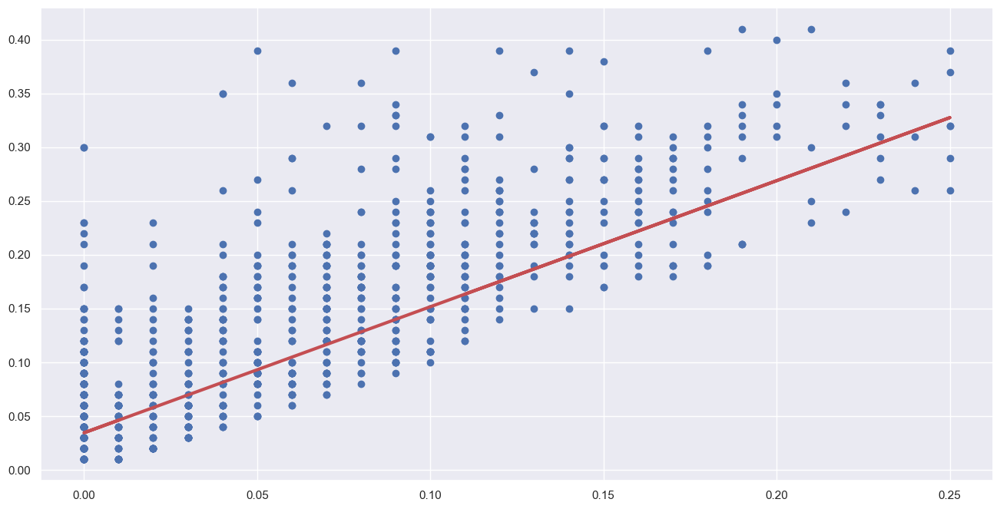

Linear Regression for EU_Sales

Intercept of EU_Sales : [0.08066259]
Coefficient of EU_Sales : [[1.82666359]]
Explained Variance (R^2) 	: 0.22390942882683929
Mean Squared Error (MSE)of EU_Sales : 0.006649745328394554
Root Mean Squared Error (RMSE) EU_Sales : 0.08154597064475076


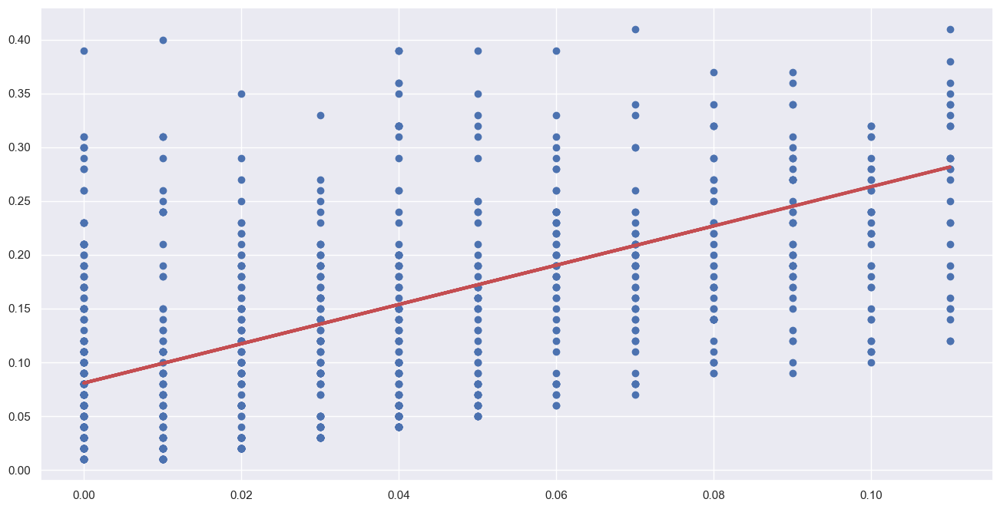

Linear Regression for Other_Sales

Intercept of Other_Sales : [0.07420451]
Coefficient of Other_Sales : [[6.24374232]]
Explained Variance (R^2) 	: 0.5323076390961637
Mean Squared Error (MSE)of Other_Sales : 0.004007309465627065
Root Mean Squared Error (RMSE) Other_Sales : 0.06330331322787983


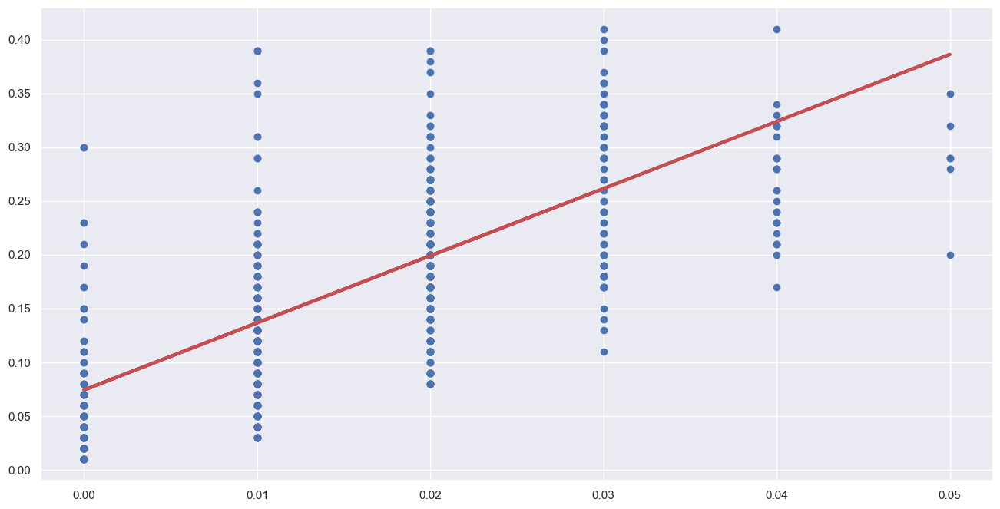

Linear Regression for Critic_Score

Intercept of Critic_Score : [0.11566661]
Coefficient of Critic_Score : [[0.00025396]]
Explained Variance (R^2) 	: -0.0017201966776023703
Mean Squared Error (MSE)of Critic_Score : 0.008582998487078804
Root Mean Squared Error (RMSE) Critic_Score : 0.09264447359167628


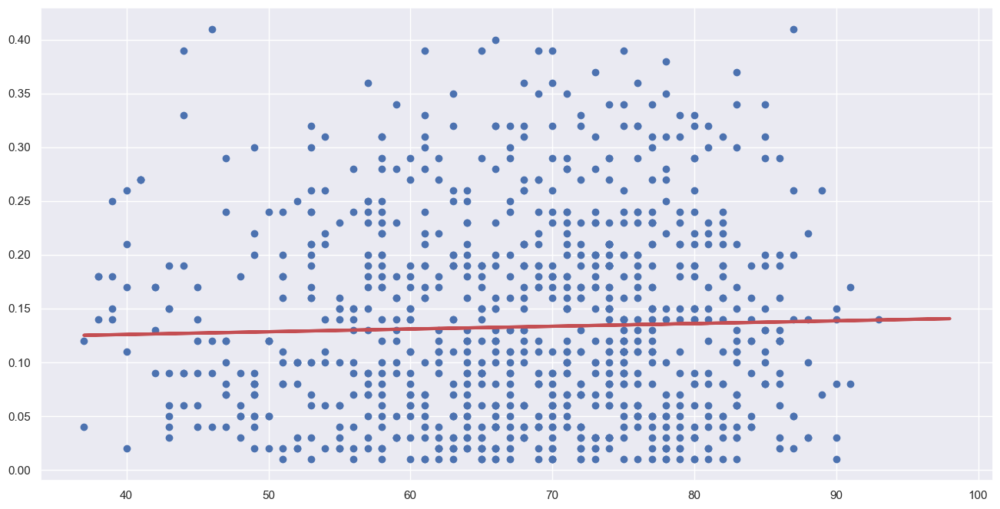

Linear Regression for Critic_Count

Intercept of Critic_Count : [0.11296656]
Coefficient of Critic_Count : [[0.00088139]]
Explained Variance (R^2) 	: 0.04750028072339385
Mean Squared Error (MSE)of Critic_Count : 0.008161264669125243
Root Mean Squared Error (RMSE) Critic_Count : 0.09033971811515266


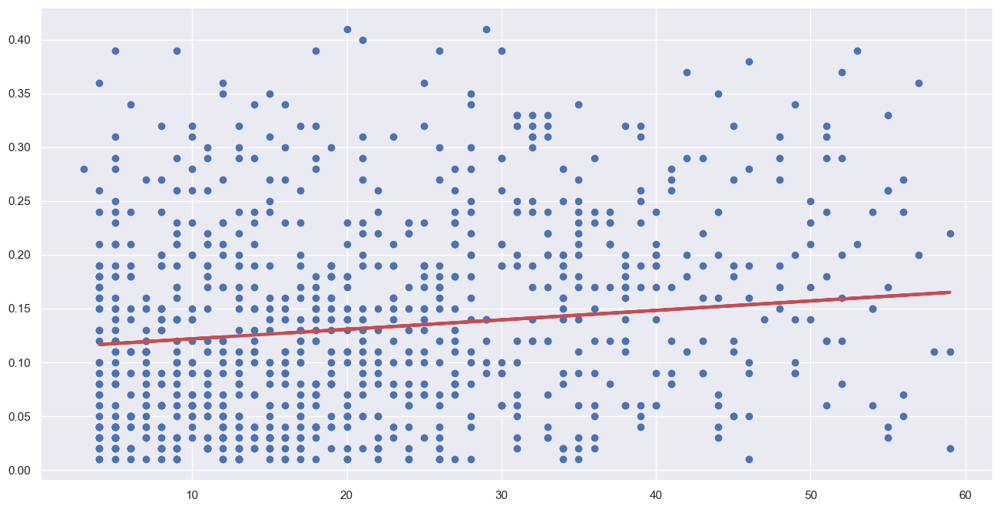

Linear Regression for User_Score

Intercept of User_Score : [0.12918208]
Coefficient of User_Score : [[0.00050011]]
Explained Variance (R^2) 	: -0.0014690428794763566
Mean Squared Error (MSE)of User_Score : 0.008580846536188229
Root Mean Squared Error (RMSE) User_Score : 0.09263285883631266


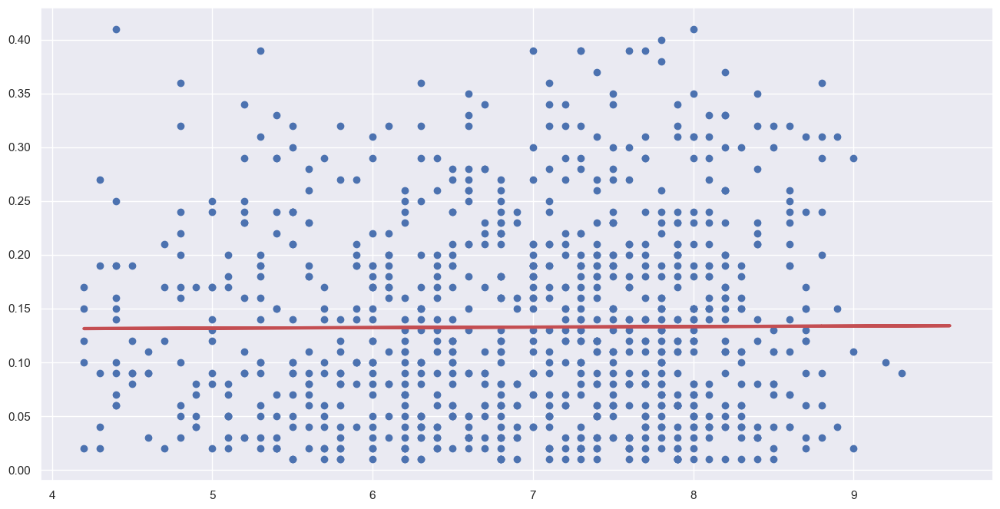

,Numeric_Columns,Intercept,Coefficient,Explained Variance (R^2),Mean Squared Error (MSE),Root Mean Squared Error (RMSE)
0,NA_Sales,[0.03431150532383388],[[1.1729032092117497]],0.544756,0.003901,0.062455
1,EU_Sales,[0.08066258619727472],[[1.8266635892450087]],0.223909,0.006650,0.081546
2,Other_Sales,[0.07420450660730304],[[6.243742322558016]],0.532308,0.004007,0.063303
3,Critic_Score,[0.11566661332890488],[[0.00025395776628295746]],-0.001720,0.008583,0.092644
4,Critic_Count,[0.11296655583315988],[[0.0008813888936803119]],0.047500,0.008161,0.090340
5,User_Score,[0.1291820798423896],[[0.000500112133791378]],-0.001469,0.008581,0.092633


In [37]:
Numeric_Columns = ['NA_Sales', 'EU_Sales', 'Other_Sales', 'Critic_Score', 'Critic_Count', 'User_Score']

results=[]

for p in Numeric_Columns:
    print("Linear Regression for",p)
    print()
    
    # Data Preparation
    X_train = train_data[p].values.reshape(-1,1)
    X_test = test_data[p].values.reshape(-1,1)
    y_train = train_data['Global_Sales'].values.reshape(-1,1)
    y_test = test_data['Global_Sales'].values.reshape(-1,1)


    # Model Fitting and Prediction
    linreg.fit(X_train,y_train)
    y_test_pred = linreg.predict(X_test)
    
    # Model Evaluation 
    print('Intercept of',p,':', linreg.intercept_) #finding the intercept 
    print('Coefficient of',p,':', linreg.coef_) #finding the coefficient
    
    print("Explained Variance (R^2) \t:", linreg.score(X_test, y_test))
    mse = mean_sq_err(y_test, y_test_pred)
    print("Mean Squared Error (MSE)of",p,":", mse)
    print("Root Mean Squared Error (RMSE)",p,":", np.sqrt(mse))
    
    
    # Results Storage
    results.append({'Numeric_Columns':p,'Intercept':linreg.intercept_,'Coefficient': linreg.coef_, 'Explained Variance (R^2)':linreg.score(X_test, y_test),'Mean Squared Error (MSE)':mse,'Root Mean Squared Error (RMSE)':np.sqrt(mse)})

    #Visualization (Formula for Regression lineregline) 
    regline_x= X_train
    regline_y=linreg.intercept_ + linreg.coef_ * X_train

    f,axes=plt.subplots(1,1,figsize=(16,8))
    plt.scatter(X_test,y_test)
    plt.plot(regline_x,regline_y,'r-',linewidth=3)#regression line
    plt.show()
    colour = 'green'
    
# DataFrame Creation    
df=pd.DataFrame(results)    
df


From the results above, we can observe that NA_Sales variable has the R^2 value which is closest to 1 (0.544756) and also has the lowest MSE (0.544756) and RMSE (0.062455) values as compared to the other numerical columns. The R^2 value closer to 1 indicates that a larger proportion of the variance of the global sales is explained by the NA_Sales variable, suggesting a better fit of the NA_Sales variable to the data. The low MSE and RMSE values indicate that the NA_Sales variable is making accurate predictions, with small differences between the predicted and actual values of the global sales. This suggests that the variable is well-fitted to the data and is capturing the underlying relationship effectively. Hence, among the numerical variables, the NA_Sales variable is the best suited to predict global sales according to the results of Linear Regression.

Then, let us perform linear regression individually for each categorical column.

Linear Regression for mean_Platform

Intercept of mean_Platform : [-0.02293693]
Coefficient of mean_Platform : [[1.14727281]]
Explained Variance (R^2) 	: 0.1283253932011169
Mean Squared Error (MSE)of mean_Platform : 0.007468734139726793
Root Mean Squared Error (RMSE) mean_Platform : 0.08642183832647159


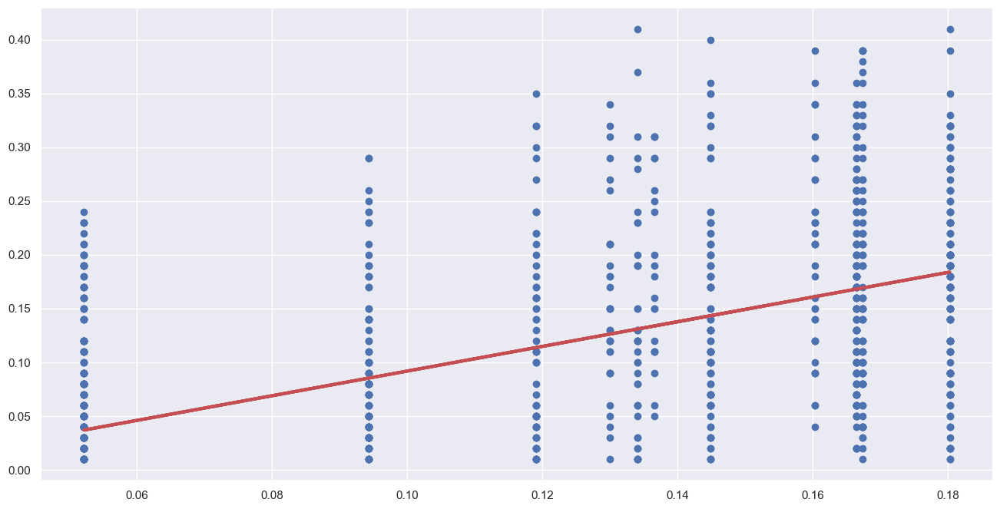

Linear Regression for mean_Genre

Intercept of mean_Genre : [0.01014421]
Coefficient of mean_Genre : [[0.92371691]]
Explained Variance (R^2) 	: 0.04908575556934447
Mean Squared Error (MSE)of mean_Genre : 0.008147679909379726
Root Mean Squared Error (RMSE) mean_Genre : 0.0902644997182155


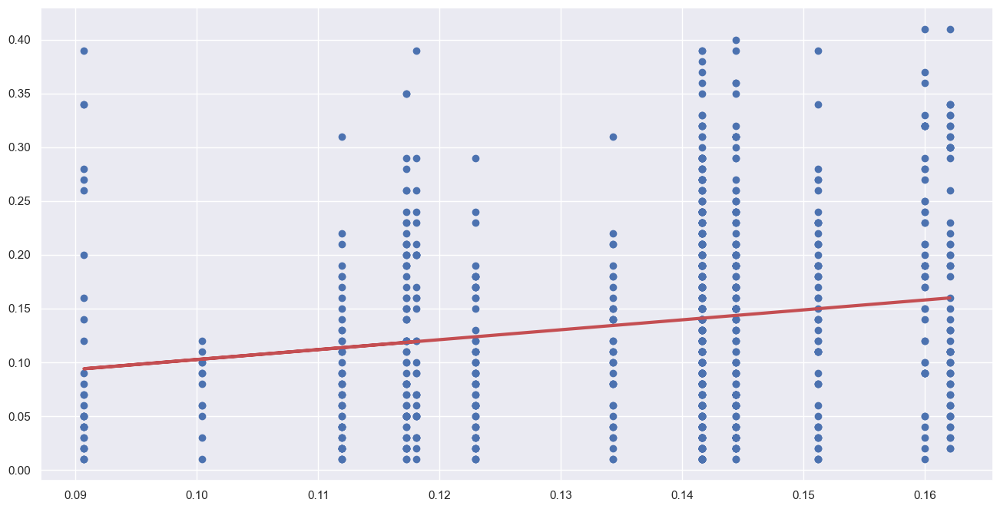

Linear Regression for mean_Publisher

Intercept of mean_Publisher : [-0.00316805]
Coefficient of mean_Publisher : [[1.01142837]]
Explained Variance (R^2) 	: 0.14692256337097354
Mean Squared Error (MSE)of mean_Publisher : 0.007309388761684855
Root Mean Squared Error (RMSE) mean_Publisher : 0.08549496337027612


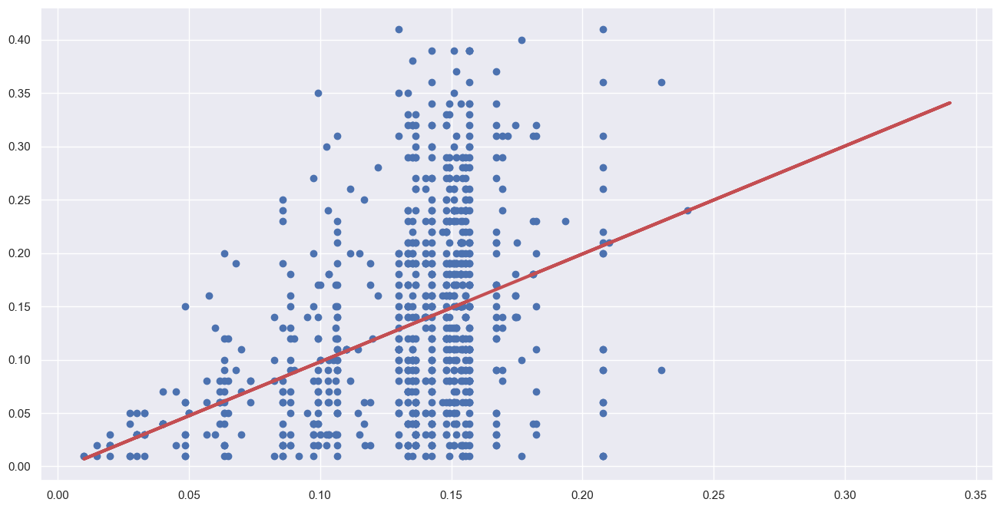

Linear Regression for mean_Developer

Intercept of mean_Developer : [0.0003642]
Coefficient of mean_Developer : [[0.98676594]]
Explained Variance (R^2) 	: 0.4317079293407642
Mean Squared Error (MSE)of mean_Developer : 0.004869273873946805
Root Mean Squared Error (RMSE) mean_Developer : 0.06978018253019123


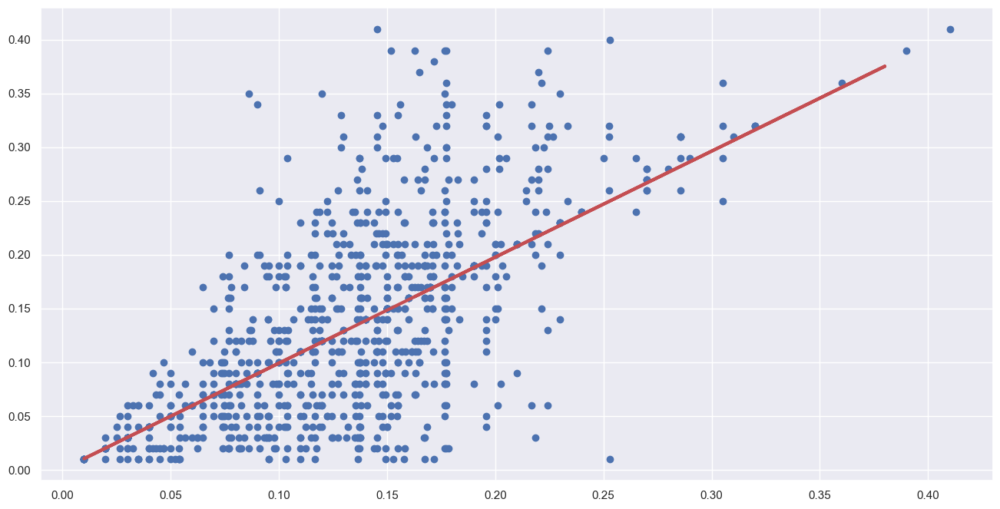

Linear Regression for mean_Rating

Intercept of mean_Rating : [-0.02730467]
Coefficient of mean_Rating : [[1.1924781]]
Explained Variance (R^2) 	: -0.0008707185705707499
Mean Squared Error (MSE)of mean_Rating : 0.00857571993830679
Root Mean Squared Error (RMSE) mean_Rating : 0.09260518310713926


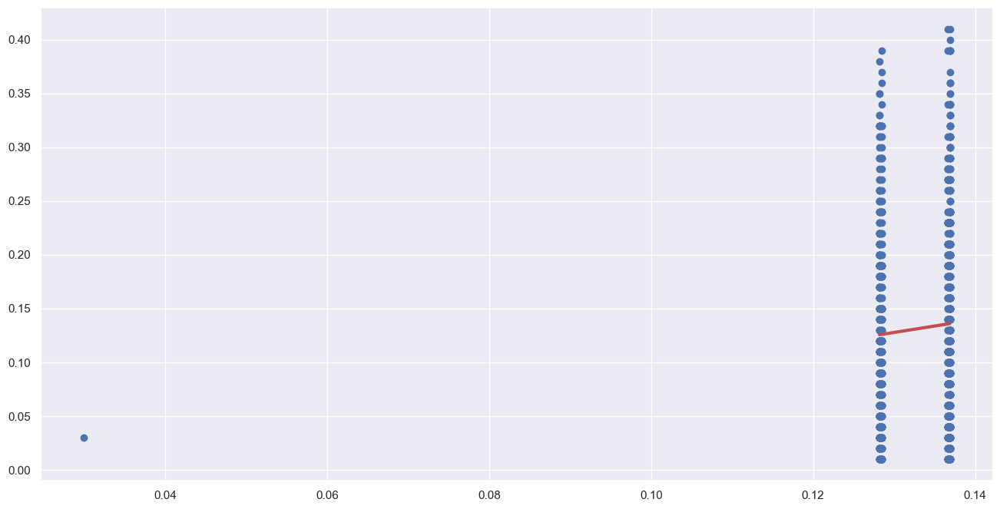

,Categorical_Columns,Intercept,Coefficient,Explained Variance (R^2),Mean Squared Error (MSE),Root Mean Squared Error (RMSE)
0,mean_Platform,[-0.022936934318154162],[[1.147272807135008]],0.128325,0.007469,0.086422
1,mean_Genre,[0.0101442107077159],[[0.9237169141415661]],0.049086,0.008148,0.090264
2,mean_Publisher,[-0.00316805228017622],[[1.0114283738921634]],0.146923,0.007309,0.085495
3,mean_Developer,[0.0003642005507176471],[[0.9867659447434067]],0.431708,0.004869,0.069780
4,mean_Rating,[-0.027304667139200878],[[1.192478098091713]],-0.000871,0.008576,0.092605


In [38]:
Categorical_Columns=['mean_Platform','mean_Genre','mean_Publisher','mean_Developer','mean_Rating']

results=[]

for p in Categorical_Columns:
    print("Linear Regression for",p)
    print()
    
    # Data Preparation
    X_train = train_data[p].values.reshape(-1,1)
    X_test = test_data[p].values.reshape(-1,1)
    y_train = train_data['Global_Sales'].values.reshape(-1,1)
    y_test = test_data['Global_Sales'].values.reshape(-1,1)

    # Model Fitting and Prediction
    linreg.fit(X_train,y_train)
    y_test_pred = linreg.predict(X_test)
    
    # Model Evaluation
    print('Intercept of',p,':', linreg.intercept_) #finding the intercept 
    print('Coefficient of',p,':', linreg.coef_) #finding the coefficient
    
    print("Explained Variance (R^2) \t:", linreg.score(X_test, y_test))
    mse = mean_sq_err(y_test, y_test_pred)
    print("Mean Squared Error (MSE)of",p,":", mse)
    print("Root Mean Squared Error (RMSE)",p,":", np.sqrt(mse))
    
    # Results Storage
    results.append({'Categorical_Columns':p,'Intercept':linreg.intercept_,'Coefficient': linreg.coef_, 'Explained Variance (R^2)':linreg.score(X_test, y_test),'Mean Squared Error (MSE)':mse,'Root Mean Squared Error (RMSE)':np.sqrt(mse)})

    #Visualization (Formula for Regression lineregline)
    regline_x= X_train
    regline_y=linreg.intercept_ + linreg.coef_ * X_train

    f,axes=plt.subplots(1,1,figsize=(16,8))
    plt.scatter(X_test,y_test)
    plt.plot(regline_x,regline_y,'r-',linewidth=3)#regression line
    plt.show()
    colour = 'green'
    
# DataFrame Creation     
df=pd.DataFrame(results)    
df

From the results above, we can observe that mean_Developer variable has the R^2 value which is closest to 1 (0.431708) and also has the lowest MSE (0.004869) and RMSE (0.069780) values as compared to the other categorical columns. The R^2 value closer to 1 indicates that a larger proportion of the variance of the global sales is explained by the mean_Developer variable, suggesting a better fit of the mean_Developer variable to the data. The low MSE and RMSE values indicate that the mean_Developer variable is making accurate predictions, with small differences between the predicted and actual values of the global sales. This suggests that the variable is well-fitted to the data and is capturing the underlying relationship effectively. Hence, among the categorical variables, the mean_Developer variable is the best suited to predict global sales according to the results of Linear Regression. 

## Lasso Regression



Lasso regression is a regularization technique that applies a penalty to prevent overfitting and enhance the accuracy of statistical linear regression models. 

The linear regression equation can be represented as follows: y = β₀ + β₁x₁ + β₂x₂ + ... + βₚxₚ + ε 

Where:
* y is the dependent variable (target)
* β₀, β₁, β₂, ..., βₚ are the coefficients (parameters) to be estimated
* x₁, x₂, ..., xₚ are the independent variables (features)
* ε represents the error term

In [39]:
Numeric_Columns=['NA_Sales','EU_Sales','Other_Sales','Critic_Score','Critic_Count','User_Score']
Categorical_Columns=['mean_Platform','mean_Genre','mean_Publisher','mean_Developer','mean_Rating']

In [40]:
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import  StandardScaler
scaler=StandardScaler()
from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score

Firstly, we will build and evaluate a Lasso regression model and then visualise the results using a Kernel Density Estimation (KDE) plot for the numerical columns

In [41]:
# Data preparation
X_train = train_data[Numeric_Columns]
X_test = test_data[Numeric_Columns]
y_train = train_data['Global_Sales']
y_test = test_data['Global_Sales']

# Lasso Regression Model without Hyperparameter Tuning

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

lasso = Lasso()
lasso.fit(X_train_scaled, y_train)
y_pred = lasso.predict(X_test_scaled)

print("Metrics for Lasso model without hyperparameter tuning:")
print("MAE:", mean_absolute_error(y_test, y_pred))
print("MSE:", mean_squared_error(y_test, y_pred))
print("R^2 Score:", r2_score(y_test, y_pred))

# Hyperparameter Tuning using GridSearchCV

param_grid = {
    'alpha': [0.01, 0.1, 1, 10, 100, 1000] #strength of Regularization
}

lasso_cv = GridSearchCV(lasso, param_grid, cv=3, n_jobs=-1)
lasso_cv.fit(X_train_scaled, y_train)

print("Best hyperparameters found by GridSearchCV:", lasso_cv.best_params_)

# Lasso Regression Model with Hyperparameter Tuning

y_pred2 = lasso_cv.predict(X_test_scaled)

print("Metrics for Lasso model with hyperparameter tuning:")
print("MAE:", mean_absolute_error(y_test, y_pred2))
print("MSE:", mean_squared_error(y_test, y_pred2))
print("R^2 Score:", r2_score(y_test, y_pred2))

best_estimator = lasso_cv.best_estimator_
lasso3 = Lasso(alpha=best_estimator.alpha)
lasso3.fit(X_train_scaled, y_train)
print("Intercept of Lasso model with best hyperparameters:", lasso3.intercept_)
print("Coefficients of Lasso model with best hyperparameters:", lasso3.coef_)

df=pd.DataFrame({'Numeric_Columns':Numeric_Columns,'Coef':lasso3.coef_})
df

Metrics for Lasso model without hyperparameter tuning:
MAE: 0.07659789363324908
MSE: 0.00858404990760388
R^2 Score: -0.0018429077763817414
Best hyperparameters found by GridSearchCV: {'alpha': 0.01}
Metrics for Lasso model with hyperparameter tuning:
MAE: 0.029376156814276907
MSE: 0.0023583904186542043
R^2 Score: 0.7247526819941321
Intercept of Lasso model with best hyperparameters: 0.13290056448111157
Coefficients of Lasso model with best hyperparameters: [0.05353402 0.01565545 0.01354986 0.         0.         0.        ]


,Numeric_Columns,Coef
0,NA_Sales,0.053534
1,EU_Sales,0.015655
2,Other_Sales,0.013550
3,Critic_Score,0.000000
4,Critic_Count,0.000000
5,User_Score,0.000000


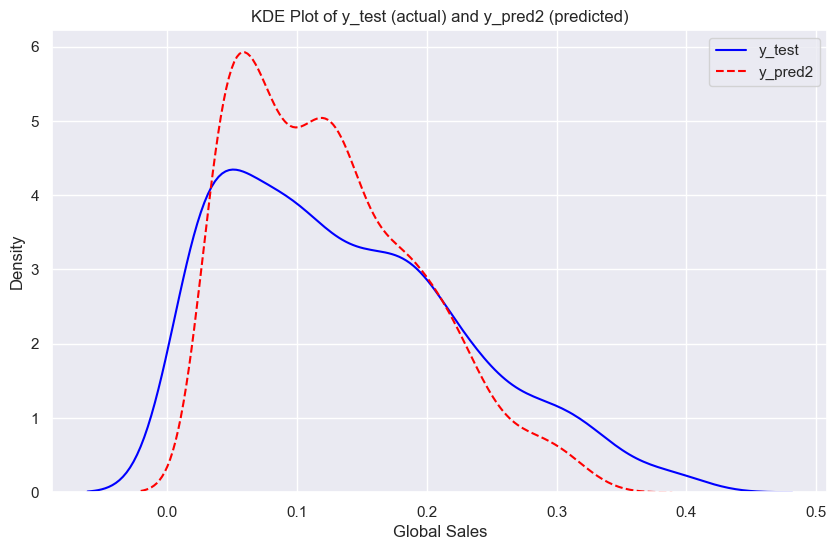

In [42]:
# Visualisation using KDE plot

import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
sns.kdeplot(y_test, label='y_test', color='blue', linestyle='-')
sns.kdeplot(y_pred2, label='y_pred2', color='red', linestyle='--')
plt.xlabel('Global Sales')
plt.ylabel('Density')
plt.title('KDE Plot of y_test (actual) and y_pred2 (predicted)')
plt.legend()
plt.show()

**Accuracy:**

From the KDE plot we can observe that both the y test and y_pred2 graphs follow a similar shape and spread, it indicates that the model's predictions (y_pred2) are close to the actual values (y_test) and that the model's predictions are relatively accurate. However, since the peak of y test graph is considerably lower than that of y_pred2, there might be notable discrepancies affecting the accuracy of the model's predictions. 

**Bias:**

Since there is no constant underestimation or overestimation of y test by y_pred2, there is no bias in the model. 

**Model Performance:**

* Since the MAE decreased from 0.076597 to 0.029376, it shows that, on average, the predictions are closer to the actual values after hyperparameter tuning.

* The MSE also decreased significantly, from 0.00858404 to 0.0023583, suggesting that the model's predictions are high in accuracy and have low variance.

* The R^2 Score increased from negative (-0.0018429) to a much higher positive value (0.72475).  The R^2 score of -0.0018429 for the untuned model indicates that the model's predictions are worse than simply using the mean of the dependent variable as a predictor and that the model failed to capture any meaningful patterns in the data. While the R^2 score of 0.72475 for the tuned model indicates that approximately 72.475% of the variance in the dependent variable can be explained by the independent variables included in the model. This means that the model with tuned hyperparameters is much more effective at capturing the underlying patterns and relationships in the data, resulting in significantly better predictions compared to just using the mean. Thus, the increase in R^2 score from a negative value to a positive one demonstrates a substantial improvement in the model's ability to explain and predict the variance in the target variable after hyperparameter tuning.

* The best alpha value found by GridSearchCV for the tuned model is 0.01, which implies that regularization with a relatively low alpha value helps improve the model's performance. Lower alpha values indicate weaker regularization, allowing more features to be selected by the model.

* The intercept of the Lasso model with the best hyperparameters is 0.1329, indicating the base prediction value when all features are zero.

*  The coefficients for the selected features are 0.05353402, 0.01565545 0.01354986, 0.0, 0.0, 0.0. These coefficients represent the weights assigned to each feature by the model. In this case, some features have been effectively 'zeroed out' by the Lasso regularization, indicating their limited contribution to the model's predictions.



Secondly, we will build and evaluate a Lasso regression model and then visualise the results using a Kernel Density Estimation (KDE) plot for the categorical columns

In [43]:
# Data Preparation

X_train = train_data[Categorical_Columns]
X_test = test_data[Categorical_Columns]
y_train = train_data['Global_Sales']
y_test = test_data['Global_Sales']

# Lasso Regression Model without Hyperparameter Tuning

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

lasso = Lasso()
lasso.fit(X_train_scaled, y_train)
y_pred = lasso.predict(X_test_scaled)

print("Metrics for Lasso model without hyperparameter tuning:")
print("MAE:", mean_absolute_error(y_test, y_pred))
print("MSE:", mean_squared_error(y_test, y_pred))
print("R^2 Score:", r2_score(y_test, y_pred))

# Hyperparameter Tuning using GridSearchCV

param_grid = {
    'alpha': [0.01, 0.1, 1, 10, 100, 1000] #strength of Regularization
}

lasso_cv = GridSearchCV(lasso, param_grid, cv=3, n_jobs=-1)
lasso_cv.fit(X_train_scaled, y_train)

print("Best hyperparameters found by GridSearchCV:", lasso_cv.best_params_)

# Lasso Regression Model with Hyperparameter Tuning

y_pred2 = lasso_cv.predict(X_test_scaled)

print("Metrics for Lasso model with hyperparameter tuning:")
print("MAE:", mean_absolute_error(y_test, y_pred2))
print("MSE:", mean_squared_error(y_test, y_pred2))
print("R^2 Score:", r2_score(y_test, y_pred2))

best_estimator = lasso_cv.best_estimator_
lasso3 = Lasso(alpha=best_estimator.alpha)
lasso3.fit(X_train_scaled, y_train)
print("Intercept of Lasso model with best hyperparameters:", lasso3.intercept_)
print("Coefficients of Lasso model with best hyperparameters:", lasso3.coef_)

df=pd.DataFrame({'Categorical_Columns':Categorical_Columns,'Coef':lasso3.coef_})
df

Metrics for Lasso model without hyperparameter tuning:
MAE: 0.07659789363324908
MSE: 0.00858404990760388
R^2 Score: -0.0018429077763817414
Best hyperparameters found by GridSearchCV: {'alpha': 0.01}
Metrics for Lasso model with hyperparameter tuning:
MAE: 0.0519497308344659
MSE: 0.0046613346947428445
R^2 Score: 0.4559764732304953
Intercept of Lasso model with best hyperparameters: 0.1329005644811116
Coefficients of Lasso model with best hyperparameters: [0.01304357 0.         0.00246752 0.03957949 0.        ]


,Categorical_Columns,Coef
0,mean_Platform,0.013044
1,mean_Genre,0.000000
2,mean_Publisher,0.002468
3,mean_Developer,0.039579
4,mean_Rating,0.000000


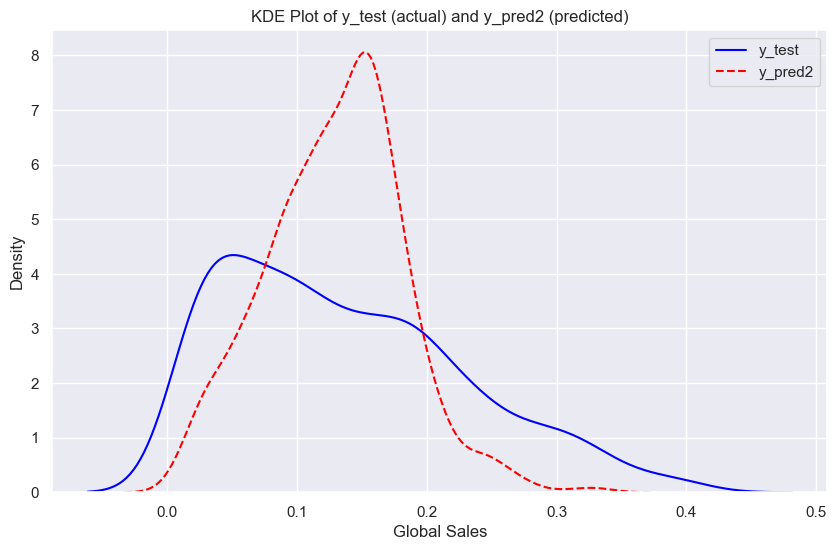

In [44]:
# Visualisation using KDE plot

plt.figure(figsize=(10, 6))
sns.kdeplot(y_test, label='y_test', color='blue', linestyle='-')
sns.kdeplot(y_pred2, label='y_pred2', color='red', linestyle='--')
plt.xlabel('Global Sales')
plt.ylabel('Density')
plt.title('KDE Plot of y_test (actual) and y_pred2 (predicted)')
plt.legend()
plt.show()

**Accuracy:**

From the KDE plot we can observe that the y test and y_pred2 are dissimilar in shape and spread, where the spread of the y_pred2 graph is narrower than that of y test. The peak of y test graph is also significantly lower than that of y_pred2. This suggests that there's a notable discrepancy between the actual global sales (y_test) and the predicted global sales (y_pred2). This could indicate that the model is not accurately capturing the patterns in the data or that there are underlying issues with the model's performance.

**Bias:**

Since there is no constant underestimation or overestimation of y test by y_pred2, there is no bias in the model. 

**Model Performance:**

* The Mean Absolute Error (MAE) decreased from 0.0766 without hyperparameter tuning to 0.0519 with hyperparameter tuning. This indicates that the tuned model's predictions are closer to the actual values, resulting in lower prediction errors.

* The Mean Squared Error (MSE) decreased from 0.0086 without hyperparameter tuning to 0.0047 with hyperparameter tuning, suggesting that the model's predictions are high in accuracy and have low variance.

* The coefficient of determination (R^2 Score) increased from -0.0018 without hyperparameter tuning to 0.4560 with hyperparameter tuning. A positive R^2 Score indicates that the tuned model explains more of the variance in the dependent variable than just using the mean of the dependent variable. This suggests that the tuned model is better at capturing the underlying patterns in the data.

* The best alpha value found by GridSearchCV for the tuned model is 0.01, which implies that regularization with a relatively low alpha value helps improve the model's performance. Lower alpha values indicate weaker regularization, allowing more features to be selected by the model.

* The intercept of the tuned Lasso model is 0.1329, indicating the base prediction value when all features are zero.

* The coefficients for the features are 0.01304357, 0, 0.00246752, 0.03957948, 0.0. This indicates that some features have been assigned non-zero coefficients, suggesting their importance in predicting the target variable. Other features might have been penalized to zero, indicating they might not be as relevant or were highly correlated with other features.

Lastly, we will build and evaluate a Lasso regression model and then visualise the results using a Kernel Density Estimation (KDE) plot for both numerical and categorical columns together.

In [46]:
# Data Preparation

Columns=['NA_Sales','EU_Sales','Other_Sales','Critic_Score','Critic_Count','User_Score','mean_Platform','mean_Genre','mean_Publisher','mean_Developer','mean_Rating']
X_train = train_data[Columns]
X_test = test_data[Columns]
y_train = train_data['Global_Sales']
y_test = test_data['Global_Sales']

# Lasso Regression Model without Hyperparameter Tuning

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

lasso = Lasso()
lasso.fit(X_train_scaled, y_train)
y_pred = lasso.predict(X_test_scaled)

print("Metrics for Lasso model without hyperparameter tuning:")
print("MAE:", mean_absolute_error(y_test, y_pred))
print("MSE:", mean_squared_error(y_test, y_pred))
print("R^2 Score:", r2_score(y_test, y_pred))

# Hyperparameter Tuning using GridSearchCV

param_grid = {
    'alpha': [0.01, 0.1, 1, 10, 100, 1000] #strength of Regularization
}

lasso_cv = GridSearchCV(lasso, param_grid, cv=3, n_jobs=-1) 
lasso_cv.fit(X_train_scaled, y_train)

print("Best hyperparameters found by GridSearchCV:", lasso_cv.best_params_)

# Lasso Regression Model with Hyperparameter Tuning

y_pred2 = lasso_cv.predict(X_test_scaled)

print("Metrics for Lasso model with hyperparameter tuning:")
print("MAE:", mean_absolute_error(y_test, y_pred2))
print("MSE:", mean_squared_error(y_test, y_pred2))
print("R^2 Score:", r2_score(y_test, y_pred2))

best_estimator = lasso_cv.best_estimator_
lasso3 = Lasso(alpha=best_estimator.alpha)
lasso3.fit(X_train_scaled, y_train)
print("Intercept of Lasso model with best hyperparameters:", lasso3.intercept_)
print("Coefficients of Lasso model with best hyperparameters:", lasso3.coef_)

df=pd.DataFrame({'Columns':Columns,'Coef':lasso3.coef_})
df

Metrics for Lasso model without hyperparameter tuning:
MAE: 0.07659789363324908
MSE: 0.00858404990760388
R^2 Score: -0.0018429077763817414
Best hyperparameters found by GridSearchCV: {'alpha': 0.01}
Metrics for Lasso model with hyperparameter tuning:
MAE: 0.02777958365283314
MSE: 0.002086901063474002
R^2 Score: 0.7564381553955781
Intercept of Lasso model with best hyperparameters: 0.13290056448111157
Coefficients of Lasso model with best hyperparameters: [0.04928594 0.0148108  0.01280174 0.         0.         0.
 0.         0.         0.         0.00889946 0.        ]


,Columns,Coef
0,NA_Sales,0.049286
1,EU_Sales,0.014811
2,Other_Sales,0.012802
3,Critic_Score,0.000000
4,Critic_Count,0.000000
5,User_Score,0.000000
6,mean_Platform,0.000000
7,mean_Genre,0.000000
8,mean_Publisher,0.000000
9,mean_Developer,0.008899


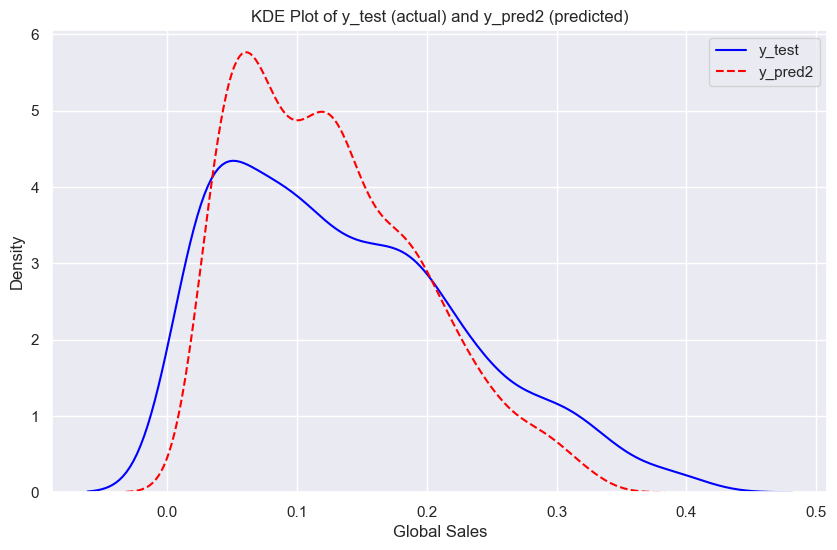

In [47]:
# Visualisation using KDE plot

plt.figure(figsize=(10, 6))
sns.kdeplot(y_test, label='y_test', color='blue', linestyle='-')
sns.kdeplot(y_pred2, label='y_pred2', color='red', linestyle='--')
plt.xlabel('Global Sales')
plt.ylabel('Density')
plt.title('KDE Plot of y_test (actual) and y_pred2 (predicted)')
plt.legend()
plt.show()

**Accuracy:**

From the KDE plot we can observe that the y test and y_pred2 are relatively similar in shape and spread, which indicates that the model's predictions (y_pred2) are close to the actual values (y_test). However, since the peak of y test is lower than that of y_pred2 the there might be a slight discrepancy in the model's prediction which then affects the accuracy of the model.

**Bias:**

Since there is no constant underestimation or overestimation of y test by y_pred2, there is no bias in the model. 

**Model Performance:**

* The Mean Absolute Error (MAE) decreased from 0.0766 without hyperparameter tuning to 0.0278 with hyperparameter tuning. This indicates that the tuned model's predictions are closer to the actual values, resulting in lower prediction errors.

* The Mean Squared Error (MSE) decreased from 0.0086 without hyperparameter tuning to 0.0021 with hyperparameter tuning, suggesting that the model's predictions are high in accuracy and have low variance.

* The coefficient of determination (R^2 Score) increased from -0.0018 without hyperparameter tuning to 0.7564 with hyperparameter tuning. A positive R^2 Score of 0.7564 indicates that the tuned model explains a substantial portion of the variance in the dependent variable, suggesting that the tuned model captures the underlying patterns in the data much better than the untuned model.

* The best alpha value found by GridSearchCV for the tuned model is 0.01, which implies that regularization with a relatively low alpha value helps improve the model's performance. Lower alpha values indicate weaker regularization, allowing more features to be selected by the model.

* The intercept of the tuned Lasso model remains at 0.1329, indicating the base prediction value when all features are zero.

* The coefficients for the features have changed significantly to 0.04928594, 0.0148108, 0.01280174, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0. Notably, some features now have non-zero coefficients, indicating their importance in predicting the target variable. Other coefficients might have been penalized to zero, suggesting they might not be as relevant or were highly correlated with other features.


In conclusion, the Lasso regression analysis demonstrated significant improvements in predictive performance following hyperparameter tuning. By adjusting the regularization parameter (alpha: 0.01), the tuned model exhibited lower prediction errors and better captured the underlying patterns in the data. Feature selection played a crucial role in the model's performance, with certain features proving to be more influential in predicting global sales. Moreover, further research could explore additional factors or refine the model to enhance its predictive capabilities. Despite certain limitations, the Lasso regression model shows promise as a tool for predicting global sales of video games. Overall, this analysis underscores the importance of advanced regression techniques and hyperparameter tuning in improving predictive modeling accuracy and informing decision-making processes.

#### Inorder to increase the accuracy even more we will be using Neural Networks

## Radial Basis function Network

RBF Network is a simple three layer feedforward neural network.The first layer corresponds to its inputs of the network, the second is hidden layer consisting of a number of RBF non-linear activation units, and the last corresponds to final output of the network

#### Activation functions in RBFs are implemented as Gaussian functions.
![image not found](RBF.jpg)

||X-Xi|| is the euclidean distance between X and Xi.The larger the distance, the smaller the value of RBF. Hence, an RBF with center Xi can be used to approximate the local characteristics of a nonlinear function close to Xi.

There will be multiple Gaussian curves and are weighted differently and we take the sum and get continuous function.To do this we need to know where Gaussian centers need to be placed.So we use K-means clustering in our input data to figure out where to place the Gaussians.

Activation of Hidden Neurons: When an input vector is presented, each hidden neuron computes the distance between the input vector and its center. It then applies the radial basis function to this distance. The output is a value that indicates how close the input is to the center of that neuron.

Output Computation: The outputs of the hidden layer neurons are then linearly combined in the output layer. The output layer typically has weights and biases that scale and shift the linear combination of hidden layer outputs to produce the final prediction.

#### Explanation of Function used:
fit - uses K-Means clusetering to initialize centre of radial basis functions. Then it computes RBF features based on the centres and trains Rigde regression model with RBF Features

predict - Predicts the target values for the given input data using trained RBFN Regressor

compute_rbf - Computes RBF features for input data based on the center

get_params - implements method to get parameters for RBFNRegressor

set_params - implements method to set parameters for RBFNRegressor

#### Hyperparameter Tuning:

param_grid - Specifies grid of hyperparameters to search and find the best parameters for n_centers, gamma, alpha

grid_search - Performs grid search with cross-validation and uses negative mean squared error as scoring metric

best_params - Retrives best hyperparameters found by grid search

best_rbfn - Instantiates new RBFNRegressor with best hyperparameters to scaled training data

y_test_pred - Make prediction on the scaled test data

In [44]:
import numpy as np
from sklearn.base import BaseEstimator, RegressorMixin
from sklearn.cluster import KMeans
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

class RBFNRegressor(BaseEstimator, RegressorMixin):
    def __init__(self, n_centers=10, gamma=1.0, alpha=1.0): #initializes the RBFNRegressor with default values
        self.n_centers = n_centers
        self.gamma = gamma
        self.alpha = alpha    #alpha gives regularization strength for Ridge Regression
        self.centers = None
        self.linear_model = None

    def fit(self, X, y):
        #Fits the RBFNRegressor to training data
        # Step 1: Initialize centers using K-Means clustering
        kmeans = KMeans(n_clusters=self.n_centers, random_state=42)  # Ensure reproducibility
        kmeans.fit(X)
        self.centers = kmeans.cluster_centers_

        # Step 2: Compute radial basis functions
        rbf = self._compute_rbf(X)

        # Step 3: Train linear model with RBF features
        self.linear_model = Ridge(alpha=self.alpha)
        self.linear_model.fit(rbf, y)

    def predict(self, X): #predicts target value for given input data using trained RBFNRegressor
        rbf = self._compute_rbf(X)
        return self.linear_model.predict(rbf)

    def _compute_rbf(self, X): #computes RBF features for input data based on centre centres
        rbf = np.array([np.exp(-self.gamma * np.linalg.norm(x - c) ** 2)
                        for x in X for c in self.centers])
        return rbf.reshape(len(X), self.n_centers)
    
    def get_params(self, deep=True):
        return {'n_centers': self.n_centers, 'gamma': self.gamma, 'alpha': self.alpha}
    
    def set_params(self, **parameters):
        for parameter, value in parameters.items():
            setattr(self, parameter, value)
        return self

### Numerical_Columns:

In [45]:
# preparing train and test dataset
X_train = train_data[Numeric_Columns]
X_test = test_data[Numeric_Columns]
y_train = train_data['Global_Sales']
y_test = test_data['Global_Sales']
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
# Hyperparameter tuning using GridSearchCV 
from sklearn.model_selection import GridSearchCV
# param_grid contains different values for n_centers,gamma, and alpha
param_grid = {
    'n_centers': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100],  # Previous values for n_centers
    'gamma': [0.001, 0.01, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0],  # More values for gamma
    'alpha': [0.0001, 0.001, 0.01, 0.1, 1.0, 10.0, 100.0, 1000.0, 10000.0]  # More values for alpha
}
rbfn = RBFNRegressor()
grid_search = GridSearchCV(rbfn, param_grid, cv=5, scoring='neg_mean_squared_error')
grid_search.fit(X_train_scaled, y_train)

best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

# Train the model with best hyperparameters
best_rbfn = RBFNRegressor(**best_params)
best_rbfn.fit(X_train_scaled, y_train)

# Make predictions
y_test_pred = best_rbfn.predict(X_test_scaled)

# Evaluate the model
test_mse = mean_squared_error(y_test, y_test_pred)
print("Test MSE:", test_mse)
print("R^2 Score:", r2_score(y_test, y_test_pred))
print("MAE:", mean_absolute_error(y_test, y_test_pred))

D:\Anaconda\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
D:\Anaconda\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
D:\Anaconda\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
D:\Anaconda\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super

Best Hyperparameters: {'alpha': 0.0001, 'gamma': 0.001, 'n_centers': 40}


D:\Anaconda\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Test MSE: 0.0022036566695957252
R^2 Score: 0.742811629781769
MAE: 0.025192976277781668


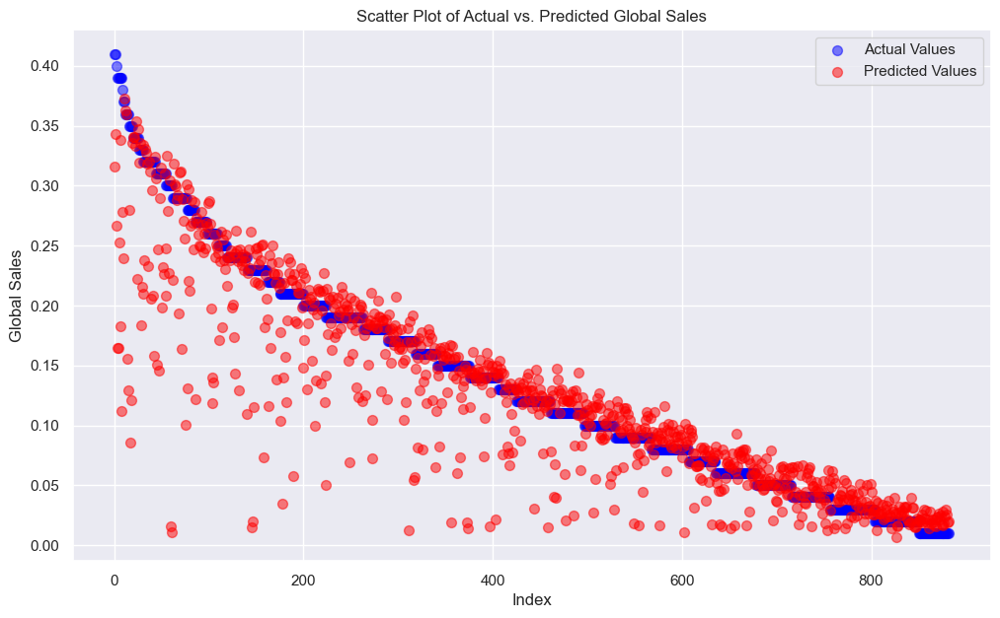

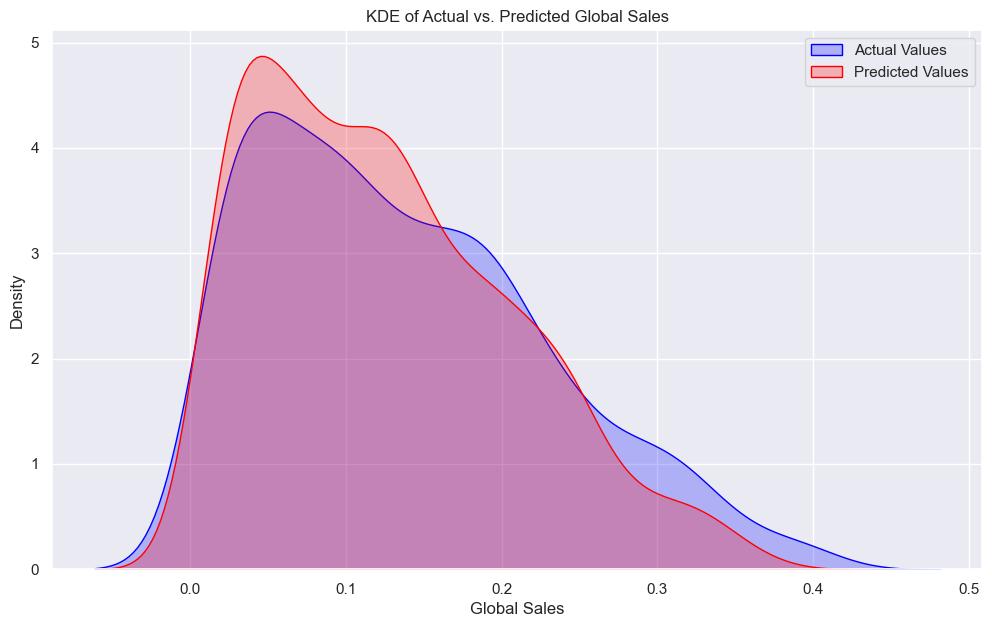

In [46]:
# Prepare the data
indices = range(len(y_test))  # Generating index values

# Create scatter plot for actual vs. predicted values
plt.figure(figsize=(12, 7))
plt.scatter(indices, y_test, color='blue', s=50, label='Actual Values', alpha=0.5)
plt.scatter(indices, y_test_pred, color='red', s=50, label='Predicted Values', alpha=0.5)
plt.title('Scatter Plot of Actual vs. Predicted Global Sales')
plt.xlabel('Index')
plt.ylabel('Global Sales')
plt.legend()
plt.grid(True)
plt.show()

# Set up the figure
plt.figure(figsize=(12, 7))

# Plot KDE for actual and predicted values
sns.kdeplot(y_test, label='Actual Values', color='blue', fill=True)
sns.kdeplot(y_test_pred, label='Predicted Values', color='red', fill=True)

# Add title and labels
plt.title('KDE of Actual vs. Predicted Global Sales')
plt.xlabel('Global Sales')
plt.ylabel('Density')
plt.legend()

# Show the plot
plt.show()

### Categorical_Columns:

In [47]:
# preparing train and test dataset
X_train = train_data[Categorical_Columns]
X_test = test_data[Categorical_Columns]
y_train = train_data['Global_Sales']
y_test = test_data['Global_Sales']
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
# Hyperparameter tuning using GridSearchCV 
from sklearn.model_selection import GridSearchCV
# param_grid contains different values for n_centers,gamma, and alpha
param_grid = {
    'n_centers': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100],  # Previous values for n_centers
    'gamma': [0.001, 0.01, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0],  # More values for gamma
    'alpha': [0.0001, 0.001, 0.01, 0.1, 1.0, 10.0, 100.0, 1000.0, 10000.0]  # More values for alpha
}
rbfn = RBFNRegressor()
grid_search = GridSearchCV(rbfn, param_grid, cv=5, scoring='neg_mean_squared_error')
grid_search.fit(X_train_scaled, y_train)

best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

# Train the model with best hyperparameters
best_rbfn = RBFNRegressor(**best_params)
best_rbfn.fit(X_train_scaled, y_train)

# Make predictions
y_test_pred = best_rbfn.predict(X_test_scaled)

# Evaluate the model
test_mse = mean_squared_error(y_test, y_test_pred)
print("Test MSE:", test_mse)
print("R^2 Score:", r2_score(y_test, y_test_pred))
print("MAE:", mean_absolute_error(y_test, y_test_pred))

D:\Anaconda\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
D:\Anaconda\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
D:\Anaconda\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
D:\Anaconda\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super

Best Hyperparameters: {'alpha': 0.0001, 'gamma': 0.001, 'n_centers': 30}


D:\Anaconda\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Test MSE: 0.005907722580636701
R^2 Score: 0.3105107691325899
MAE: 0.05300455005331339


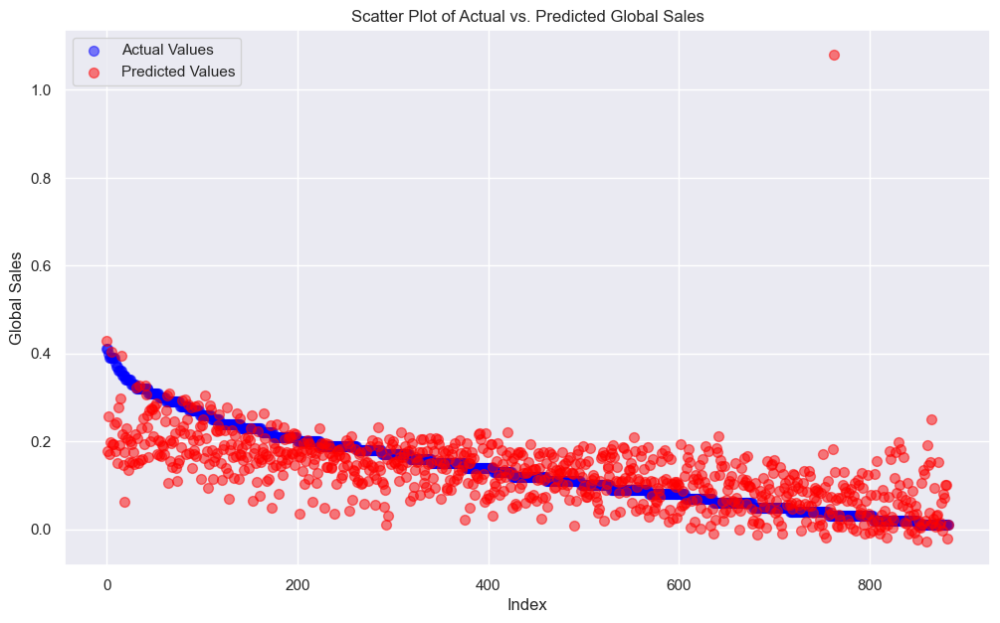

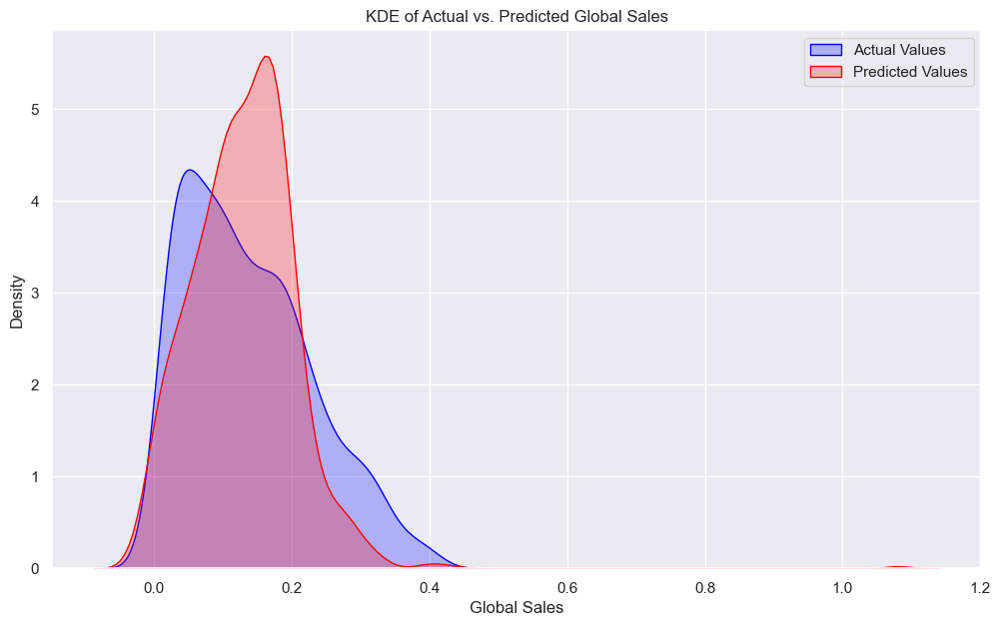

In [48]:
# Prepare the data
indices = range(len(y_test))  # Generating index values

# Create scatter plot for actual vs. predicted values
plt.figure(figsize=(12, 7))
plt.scatter(indices, y_test, color='blue', s=50, label='Actual Values', alpha=0.5)
plt.scatter(indices, y_test_pred, color='red', s=50, label='Predicted Values', alpha=0.5)
plt.title('Scatter Plot of Actual vs. Predicted Global Sales')
plt.xlabel('Index')
plt.ylabel('Global Sales')
plt.legend()
plt.grid(True)
plt.show()

# Set up the figure
plt.figure(figsize=(12, 7))

# Plot KDE for actual and predicted values
sns.kdeplot(y_test, label='Actual Values', color='blue', fill=True)
sns.kdeplot(y_test_pred, label='Predicted Values', color='red', fill=True)

# Add title and labels
plt.title('KDE of Actual vs. Predicted Global Sales')
plt.xlabel('Global Sales')
plt.ylabel('Density')
plt.legend()

# Show the plot
plt.show()

### All_Columns

In [49]:
# preparing train and test dataset
X_train = train_data[Columns]
X_test = test_data[Columns]
y_train = train_data['Global_Sales']
y_test = test_data['Global_Sales']
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
# Hyperparameter tuning using GridSearchCV 
from sklearn.model_selection import GridSearchCV
# param_grid contains different values for n_centers,gamma, and alpha
param_grid = {
    'n_centers': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100],  # Previous values for n_centers
    'gamma': [0.001, 0.01, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0],  # More values for gamma
    'alpha': [0.0001, 0.001, 0.01, 0.1, 1.0, 10.0, 100.0, 1000.0, 10000.0]  # More values for alpha
}
rbfn = RBFNRegressor()
grid_search = GridSearchCV(rbfn, param_grid, cv=5, scoring='neg_mean_squared_error')
grid_search.fit(X_train_scaled, y_train)

best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

# Train the model with best hyperparameters
best_rbfn = RBFNRegressor(**best_params)
best_rbfn.fit(X_train_scaled, y_train)

# Make predictions
y_test_pred = best_rbfn.predict(X_test_scaled)

# Evaluate the model
test_mse = mean_squared_error(y_test, y_test_pred)
print("Test MSE:", test_mse)
print("R^2 Score:", r2_score(y_test, y_test_pred))
print("MAE:", mean_absolute_error(y_test, y_test_pred))

D:\Anaconda\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
D:\Anaconda\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
D:\Anaconda\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
D:\Anaconda\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super

Best Hyperparameters: {'alpha': 0.0001, 'gamma': 0.001, 'n_centers': 60}


D:\Anaconda\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Test MSE: 0.001976806785410951
R^2 Score: 0.7692872386198644
MAE: 0.02454337259726001


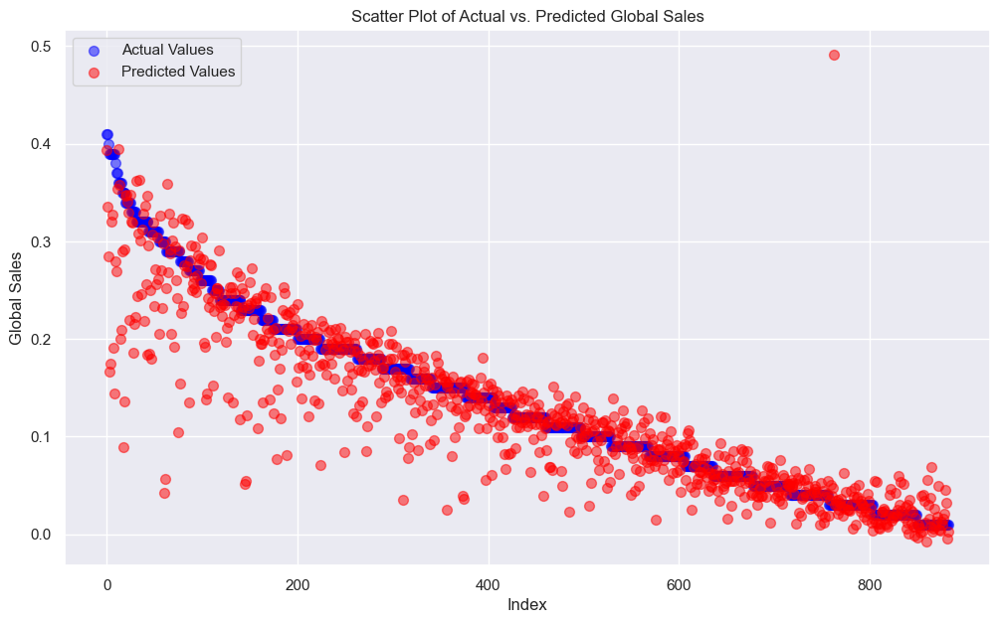

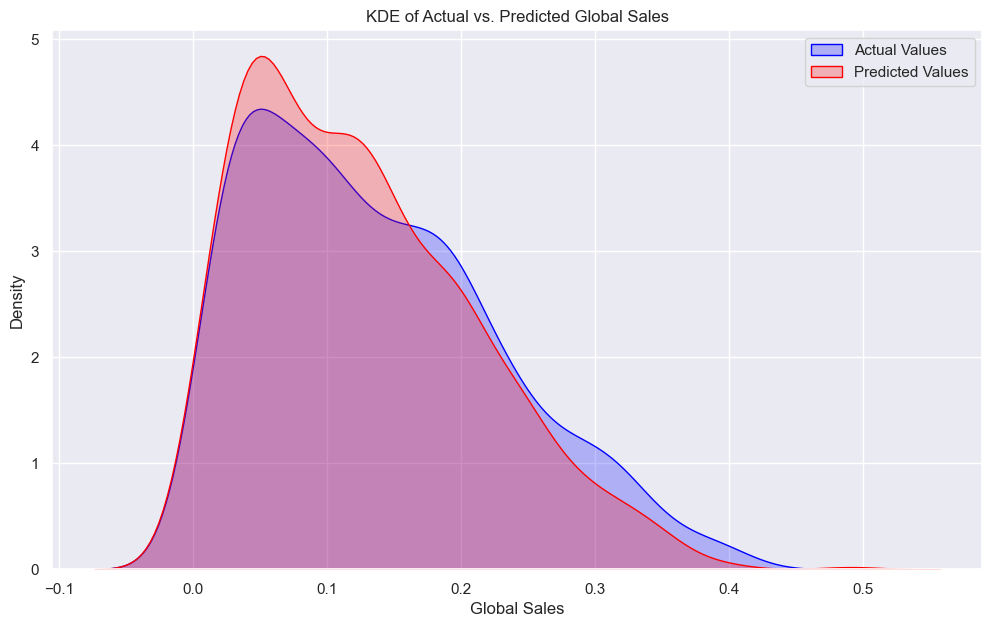

In [50]:
# Prepare the data
indices = range(len(y_test))  # Generating index values

# Create scatter plot for actual vs. predicted values
plt.figure(figsize=(12, 7))
plt.scatter(indices, y_test, color='blue', s=50, label='Actual Values', alpha=0.5)
plt.scatter(indices, y_test_pred, color='red', s=50, label='Predicted Values', alpha=0.5)
plt.title('Scatter Plot of Actual vs. Predicted Global Sales')
plt.xlabel('Index')
plt.ylabel('Global Sales')
plt.legend()
plt.grid(True)
plt.show()

# Set up the figure
plt.figure(figsize=(12, 7))

# Plot KDE for actual and predicted values
sns.kdeplot(y_test, label='Actual Values', color='blue', fill=True)
sns.kdeplot(y_test_pred, label='Predicted Values', color='red', fill=True)

# Add title and labels
plt.title('KDE of Actual vs. Predicted Global Sales')
plt.xlabel('Global Sales')
plt.ylabel('Density')
plt.legend()

# Show the plot
plt.show()

#### Conclusion:
After predicting the the global sales using RBF Network we found that the MSE has slightly reduced and provided a better accuracy.